This notebook is the aggregation of <b><i>dictionary_based_labelling.ipynb</i></b>, <b><i>economic_articles_segregation.ipynb</i></b> with results of our index compared to the indicators taken from government websites.

In [20]:
import pandas as pd
import numpy as np

df_02_06 = pd.read_csv("scrapped_articles/articles2002-2006.csv")
df_07 = pd.read_csv("scrapped_articles/articles2007.csv")
df_08 = pd.read_csv("scrapped_articles/articles2008.csv")
df_09 = pd.read_csv("scrapped_articles/articles2009.csv")
df_10 = pd.read_csv("scrapped_articles/articles2010.csv")

In [22]:
# First three articles of every dataframe which we extracted from the links are just the introduction about the 
# economic times newspaper so I remove these rows from the dataframe.
df_02_06 = df_02_06.drop([0,1,2])
df_07 = df_07.drop([0,1,2])
df_08 = df_08.drop([0,1,2])
df_09 = df_09.drop([0,1,2])
df_10 = df_10.drop([0,1,2])

In [23]:
df_10.columns

Index(['Unnamed: 0', 'Year', 'Month', 'Title', 'Text', 'Keywords'], dtype='object')

In [24]:
df = pd.concat([df_02_06, df_07, df_08, df_09, df_10], ignore_index=True, sort=False)

In [25]:
df = df.drop(["Unnamed: 0"], axis = 1)

In [26]:
df['Text'] = df['Text'].str.replace('\n','')
df['Text'] = df['Text'].str.replace('AllowNot now','')
df['Text'] = df['Text'].str.replace('Add Comment','')

In [27]:
df = df[~(df['Text']=="Never miss a great news story!Get instant notifications from Economic TimesYou can switch off notifications anytime using browser settings.")]
df = df[~(df['Text']=="Find this comment offensive?Choose your reason below and click on the Report button. This will alert our moderators to take actionNameReason for reporting:Foul languageSlanderousInciting hatred against a certain community")]

In [28]:
df.shape

(201008, 5)

In [29]:
df.tail()

,Year,Month,Title,Text,Keywords
216832,2010,12,"FinMin cleared FDI proposals worth Rs 23,700 c...",NEW DELHI: The Finance Ministry cleared 212 fo...,"['investment', '23700', 'cr', 'refineries', 'm..."
216833,2010,12,RBI tightens norms for investment by banks in ...,"MUMBAI: Tightening investment norms, the Reser...","['purpose', 'investment', 'instruments', 'way'..."
216834,2010,12,"Videocon Industries converts 5,025 shares into...",MUMBAI: Electronics appliances and consumer go...,"['converts', 'rights', 'payment', 'shareholder..."
216835,2010,12,Air India reinstates 8 employees sacked after ...,"NEW DELHI: In some good news on New Year eve, ...","['work', 'plane', 'sacked', 'media', 'terminat..."
216836,2010,12,"SBI, ICICI, HDFC Bank, others hike interest ra...","NEW DELHI: Major lenders, including State Bank...","['rates', 'hike', 'hdfc', 'bank', 'increase', ..."


(array([27438., 13645., 15780., 16476., 15018., 17050., 18497., 19664.,
        19312., 38128.]),
 array([ 1. ,  2.1,  3.2,  4.3,  5.4,  6.5,  7.6,  8.7,  9.8, 10.9, 12. ]),
 <a list of 10 Patch objects>)

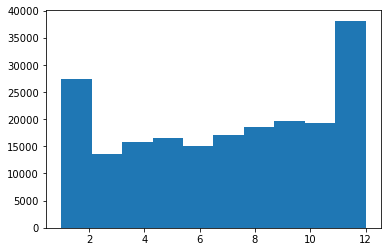

In [33]:
# Number of articles published in each month from 2002-2012
import matplotlib.pyplot as plt
plt.hist(df['Month'])

(array([ 1853.,  1133.,   950.,   853., 20281., 36426., 45816., 42979.,
        50717.]),
 array([2002.        , 2002.88888889, 2003.77777778, 2004.66666667,
        2005.55555556, 2006.44444444, 2007.33333333, 2008.22222222,
        2009.11111111, 2010.        ]),
 <a list of 9 Patch objects>)

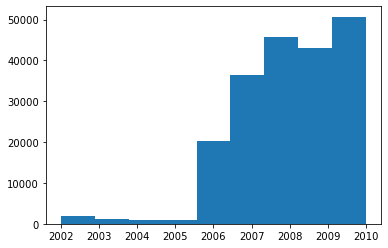

In [36]:
# year-wise article plots
plt.hist(df['Year'].to_list(), bins=9)

In [37]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from sklearn import metrics
import numpy as np
import pandas as pd
import json
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.cluster import KMeansClusterer, cosine_distance
from sklearn.metrics import precision_recall_fscore_support
import warnings
warnings.filterwarnings('ignore')

The detail of vader + LM + HL can be found in <i>dictionary_based_labelling.ipynb</i> file.

In [38]:
corpus = []
idea = df.iloc[:, 3:4]
for index, row in idea.iterrows():
    corpus.append(row['Text'])

In [39]:
#Function to remove unwanted string in the tweet
def remove_unwanted_string(dataframe):
    new_record = []
    tweet_text = dataframe.apply(lambda x: str(x).split())
    for record in tweet_text:
        for text in record:
            if 'RT' in text or '@' in text or '#' in text:
                record.remove(text)
        
        new_record.append(' '.join(record))
    dataframe = new_record
    return dataframe

df['Text'] = remove_unwanted_string(df['Text'])
df.head()

,Year,Month,Title,Text,Keywords
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '..."
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec..."
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'..."
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie..."
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '..."


In [40]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import numpy as np
import pandas as pd

In [43]:
#vader
def sentiment_scores(sentence):
    """
    Create a SentimentIntensityAnalyzer object. 
    polarity_scores() method of SentimentIntensityAnalyzer.
    object gives a sentiment dictionary
    which contains pos, neg, neu, and compoind scores
    """
    sid_obj = SentimentIntensityAnalyzer() 
    sentiment_dict = sid_obj.polarity_scores(sentence)
    
    return sentiment_dict

In [44]:
text = df.iloc[0,3]
sentiment_scores(text)

{'neg': 0.081, 'neu': 0.849, 'pos': 0.07, 'compound': -0.6898}

In [45]:
pos, neg, neu, comp = [], [], [], []
for text in df['Text']:
    sentiment = sentiment_scores(text)
    pos.append(sentiment['pos'])
    neg.append(sentiment['neg'])
    neu.append(sentiment['neu'])
    comp.append(sentiment['compound'])
    
# df_tweets_sentiment.columns = ['tweet_text', 'positive', 'negative', 'neutral', 'compound']
df['vader_positive'] = pos
df['Vader_negative'] = neg
df['vader_neutral'] = neu
df['vader_compound'] = comp

In [46]:
df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643


In [45]:
df.columns

Index(['Year', 'Month', 'Title', 'Text', 'Keywords', 'vader_positive',
       'Vader_negative', 'vader_neutral', 'vader_compound', 'token',
       'vadar_LM_scores', 'vader_LM_positive', 'vader_LM_negative',
       'vader_LM_neutral', 'vader_LM_compound', 'vadar_LM_HU_scores',
       'vader_LM_HU_positive', 'vader_LM_HU_negative', 'vader_LM_HU_neutral',
       'vader_LM_HU_compound', 'count_eco_words', 'articles_contain_words',
       'eco_words_bool', 'eco_words_bool_count', 'concat_time'],
      dtype='object')

In [49]:
df[(df['Year'] == 2008) & (df['Month']==12)].shape

(4321, 25)

In [47]:
# vader + LM
import json
import nltk
import pickle
import pprint
import re

from tqdm import tqdm

df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643


In [48]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nrjkh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\nrjkh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [49]:
from nltk.corpus import stopwords

wnl = nltk.stem.WordNetLemmatizer()

lemma_english_stopwords = [wnl.lemmatize(x) for x in stopwords.words('english')]

def preprocess(paragraphs):
#     message = ' '.join(paragraphs)
    
    # Lowercase the message
    text = paragraphs.lower()
    
    # Replace everything not a letter with a space
    text = re.sub(r'[^a-zA-Z]', ' ', text)
    
    # Tokenize by splitting the string on whitespace into a list of words
    tokens = text.split()

    # Lemmatize wotwo corpora: the stopwords corpus for removing stopwords and wordnet for lemmatizing.

    wnl = nltk.stem.WordNetLemmatizer()
    tokens = [wnl.lemmatize(x) for x in tokens if len(x)>1]
    tokens = [x for x in tokens if x not in lemma_english_stopwords]
    
    return tokens

In [50]:
df["token"] = df["Text"].apply(preprocess)

In [51]:
import os

sentiments = ['Negative', 'Positive', 'Uncertainty', 'Litigious', 'StrongModal', 'WeakModal', 'Constraining']

# read sentiment words
path_LM = os.path.join('C:\Allenai\economics_btp', 'LoughranMcDonald_SentimentWordLists_2018.xlsx')
dict_LM = {} # sentiment: [word list]
for s in sentiments:
    df_temp = pd.read_excel(path_LM, s, header=None)
    dict_LM[s] = np.array(df_temp.iloc[:,0])
    
# print out sentiment+words
for s, word_list in dict_LM.items():
    print(s,':\t', word_list[:5], '...')

Negative :	 ['ABANDON' 'ABANDONED' 'ABANDONING' 'ABANDONMENT' 'ABANDONMENTS'] ...
Positive :	 ['ABLE' 'ABUNDANCE' 'ABUNDANT' 'ACCLAIMED' 'ACCOMPLISH'] ...
Uncertainty :	 ['ABEYANCE' 'ABEYANCES' 'ALMOST' 'ALTERATION' 'ALTERATIONS'] ...
Litigious :	 ['ABOVEMENTIONED' 'ABROGATE' 'ABROGATED' 'ABROGATES' 'ABROGATING'] ...
StrongModal :	 ['ALWAYS' 'BEST' 'CLEARLY' 'DEFINITELY' 'DEFINITIVELY'] ...
WeakModal :	 ['ALMOST' 'APPARENTLY' 'APPEARED' 'APPEARING' 'APPEARS'] ...
Constraining :	 ['ABIDE' 'ABIDING' 'BOUND' 'BOUNDED' 'COMMIT'] ...


In [52]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

new_words = {}
for w in dict_LM['Negative']:
    new_words[w.lower()] = -1
for w in dict_LM['Positive']:
    new_words[w.lower()] = 1

sia = SentimentIntensityAnalyzer()

sia.lexicon.update(new_words)

In [53]:
def sentiment_add(tokens):
    text = " ".join(tokens)
    return sia.polarity_scores(text)

df['vadar_LM_scores'] = df["token"].apply(sentiment_add)

In [54]:
def type_pos(score):
    return score["pos"]

def type_neg(score):
    return score["neg"]

def type_neu(score):
    return score["neu"]

def type_comp(score):
    return score["compound"]

df["vader_LM_positive"] = df["vadar_LM_scores"].apply(type_pos)

df["vader_LM_negative"] = df["vadar_LM_scores"].apply(type_neg)

df["vader_LM_neutral"] = df["vadar_LM_scores"].apply(type_neu)

df["vader_LM_compound"] = df["vadar_LM_scores"].apply(type_comp)

In [55]:
df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound,token,vadar_LM_scores,vader_LM_positive,vader_LM_negative,vader_LM_neutral,vader_LM_compound
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898,"[union, coal, ministry, tuesday, said, likely,...","{'neg': 0.135, 'neu': 0.764, 'pos': 0.101, 'co...",0.101,0.135,0.764,-0.5574
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951,"[yashwant, sinha, harping, per, cent, growth, ...","{'neg': 0.076, 'neu': 0.698, 'pos': 0.226, 'co...",0.226,0.076,0.698,0.9973
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987,"[jan, enron, threatens, invoke, lcs, guarantee...","{'neg': 0.188, 'neu': 0.72, 'pos': 0.093, 'com...",0.093,0.188,0.720,-0.9989
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859,"[government, tuesday, invited, initial, bid, t...","{'neg': 0.046, 'neu': 0.93, 'pos': 0.024, 'com...",0.024,0.046,0.930,-0.5859
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643,"[government, proposed, transition, period, two...","{'neg': 0.017, 'neu': 0.864, 'pos': 0.119, 'co...",0.119,0.017,0.864,0.9808


In [56]:
# update vader + LM + HL
import os
positive_words = []

with open('hu_positive_words.txt', 'r') as f:
    positive_words = [line.strip() for line in f]
    f.close()
    
positive_words = positive_words[35:]
positive_words[:5]

['a+', 'abound', 'abounds', 'abundance', 'abundant']

In [57]:
negative_words = []

with open('hu_negative_words.txt', 'r') as f:
    negative_words = [line.strip() for line in f]
    f.close()
    
negative_words = negative_words[35:]
negative_words[:5]

['2-faced', '2-faces', 'abnormal', 'abolish', 'abominable']

In [58]:
for w in positive_words:
    new_words[w.lower()] = 1

for w in negative_words:
    new_words[w.lower()] = -1    

In [59]:
sia = SentimentIntensityAnalyzer()

sia.lexicon.update(new_words)

In [60]:
def sentiment_add(tokens):
    text = " ".join(tokens)
    return sia.polarity_scores(text)

df['vadar_LM_HU_scores'] = df["token"].apply(sentiment_add)

In [61]:
def type_pos(score):
    return score["pos"]

def type_neg(score):
    return score["neg"]

def type_neu(score):
    return score["neu"]

def type_comp(score):
    return score["compound"]

df["vader_LM_HU_positive"] = df["vadar_LM_HU_scores"].apply(type_pos)

df["vader_LM_HU_negative"] = df["vadar_LM_HU_scores"].apply(type_neg)

df["vader_LM_HU_neutral"] = df["vadar_LM_HU_scores"].apply(type_neu)

df["vader_LM_HU_compound"] = df["vadar_LM_HU_scores"].apply(type_comp)

In [63]:
df.to_csv("supervised_text_large.csv")

In [64]:
import pandas as pd
df = pd.read_csv("supervised_text_large.csv", index_col = None)
df = df.drop(["Unnamed: 0"], axis = 1)
df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound,token,vadar_LM_scores,vader_LM_positive,vader_LM_negative,vader_LM_neutral,vader_LM_compound,vadar_LM_HU_scores,vader_LM_HU_positive,vader_LM_HU_negative,vader_LM_HU_neutral,vader_LM_HU_compound
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898,"['union', 'coal', 'ministry', 'tuesday', 'said...","{'neg': 0.135, 'neu': 0.764, 'pos': 0.101, 'co...",0.101,0.135,0.764,-0.5574,"{'neg': 0.133, 'neu': 0.734, 'pos': 0.133, 'co...",0.133,0.133,0.734,-0.0258
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951,"['yashwant', 'sinha', 'harping', 'per', 'cent'...","{'neg': 0.076, 'neu': 0.698, 'pos': 0.226, 'co...",0.226,0.076,0.698,0.9973,"{'neg': 0.082, 'neu': 0.677, 'pos': 0.241, 'co...",0.241,0.082,0.677,0.9976
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987,"['jan', 'enron', 'threatens', 'invoke', 'lcs',...","{'neg': 0.188, 'neu': 0.72, 'pos': 0.093, 'com...",0.093,0.188,0.720,-0.9989,"{'neg': 0.199, 'neu': 0.709, 'pos': 0.092, 'co...",0.092,0.199,0.709,-0.9987
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859,"['government', 'tuesday', 'invited', 'initial'...","{'neg': 0.046, 'neu': 0.93, 'pos': 0.024, 'com...",0.024,0.046,0.930,-0.5859,"{'neg': 0.046, 'neu': 0.914, 'pos': 0.04, 'com...",0.040,0.046,0.914,-0.4019
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643,"['government', 'proposed', 'transition', 'peri...","{'neg': 0.017, 'neu': 0.864, 'pos': 0.119, 'co...",0.119,0.017,0.864,0.9808,"{'neg': 0.036, 'neu': 0.841, 'pos': 0.123, 'co...",0.123,0.036,0.841,0.9723


In [65]:
def lowertext(words):
    words = words[0:-1]
    return words.lower()

f = open("eco_dictionary1.txt", "r")
text = f.readlines()
f.close()

eco_dictionary1 = []
for words in text:
    eco_dictionary1.append(lowertext(words))

len(eco_dictionary1)

3234

In [66]:
f = open("eco_dictionary2.txt", "r")
text = f.readlines()
f.close()

eco_dictionary2 = []
for words in text:
    eco_dictionary2.append(lowertext(words))

eco_dictionary2 = list(set(eco_dictionary2))
len(eco_dictionary2)

580

In [67]:
eco_dictionary = eco_dictionary1 + eco_dictionary2
eco_dictionary = set(list(eco_dictionary))

len(eco_dictionary)

3443

In [68]:
df['Text'] = df['Text'].str.lower()
df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound,token,vadar_LM_scores,vader_LM_positive,vader_LM_negative,vader_LM_neutral,vader_LM_compound,vadar_LM_HU_scores,vader_LM_HU_positive,vader_LM_HU_negative,vader_LM_HU_neutral,vader_LM_HU_compound
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898,"['union', 'coal', 'ministry', 'tuesday', 'said...","{'neg': 0.135, 'neu': 0.764, 'pos': 0.101, 'co...",0.101,0.135,0.764,-0.5574,"{'neg': 0.133, 'neu': 0.734, 'pos': 0.133, 'co...",0.133,0.133,0.734,-0.0258
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951,"['yashwant', 'sinha', 'harping', 'per', 'cent'...","{'neg': 0.076, 'neu': 0.698, 'pos': 0.226, 'co...",0.226,0.076,0.698,0.9973,"{'neg': 0.082, 'neu': 0.677, 'pos': 0.241, 'co...",0.241,0.082,0.677,0.9976
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987,"['jan', 'enron', 'threatens', 'invoke', 'lcs',...","{'neg': 0.188, 'neu': 0.72, 'pos': 0.093, 'com...",0.093,0.188,0.720,-0.9989,"{'neg': 0.199, 'neu': 0.709, 'pos': 0.092, 'co...",0.092,0.199,0.709,-0.9987
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859,"['government', 'tuesday', 'invited', 'initial'...","{'neg': 0.046, 'neu': 0.93, 'pos': 0.024, 'com...",0.024,0.046,0.930,-0.5859,"{'neg': 0.046, 'neu': 0.914, 'pos': 0.04, 'com...",0.040,0.046,0.914,-0.4019
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643,"['government', 'proposed', 'transition', 'peri...","{'neg': 0.017, 'neu': 0.864, 'pos': 0.119, 'co...",0.119,0.017,0.864,0.9808,"{'neg': 0.036, 'neu': 0.841, 'pos': 0.123, 'co...",0.123,0.036,0.841,0.9723


In [69]:
df['count_eco_words'] = 0

for string in eco_dictionary:
    df['count_eco_words'] += df['Text'].str.count(string)
    
df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound,token,...,vader_LM_positive,vader_LM_negative,vader_LM_neutral,vader_LM_compound,vadar_LM_HU_scores,vader_LM_HU_positive,vader_LM_HU_negative,vader_LM_HU_neutral,vader_LM_HU_compound,count_eco_words
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898,"['union', 'coal', 'ministry', 'tuesday', 'said...",...,0.101,0.135,0.764,-0.5574,"{'neg': 0.133, 'neu': 0.734, 'pos': 0.133, 'co...",0.133,0.133,0.734,-0.0258,29
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951,"['yashwant', 'sinha', 'harping', 'per', 'cent'...",...,0.226,0.076,0.698,0.9973,"{'neg': 0.082, 'neu': 0.677, 'pos': 0.241, 'co...",0.241,0.082,0.677,0.9976,161
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987,"['jan', 'enron', 'threatens', 'invoke', 'lcs',...",...,0.093,0.188,0.720,-0.9989,"{'neg': 0.199, 'neu': 0.709, 'pos': 0.092, 'co...",0.092,0.199,0.709,-0.9987,155
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859,"['government', 'tuesday', 'invited', 'initial'...",...,0.024,0.046,0.930,-0.5859,"{'neg': 0.046, 'neu': 0.914, 'pos': 0.04, 'com...",0.040,0.046,0.914,-0.4019,16
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643,"['government', 'proposed', 'transition', 'peri...",...,0.119,0.017,0.864,0.9808,"{'neg': 0.036, 'neu': 0.841, 'pos': 0.123, 'co...",0.123,0.036,0.841,0.9723,94


In [70]:
df_eco = df[df['count_eco_words'] != 0]
df_non_eco = df[df['count_eco_words'] == 0]

In [71]:
df_non_eco.tail()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound,token,...,vader_LM_positive,vader_LM_negative,vader_LM_neutral,vader_LM_compound,vadar_LM_HU_scores,vader_LM_HU_positive,vader_LM_HU_negative,vader_LM_HU_neutral,vader_LM_HU_compound,count_eco_words
197781,2010,12,Rahul Gandhi could probably be next PM: Pranab,kart 3610 days agoit is a democracy? we never ...,"['rahul', 'seeing', 'dynasty', 'gandhi', 'stat...",0.000,0.055,0.945,-0.5719,"['kart', 'day', 'agoit', 'democracy', 'never',...",...,0.000,0.117,0.883,-0.5719,"{'neg': 0.065, 'neu': 0.871, 'pos': 0.065, 'co...",0.065,0.065,0.871,0.00,0
199702,2010,12,Design thinking: Why business leaders need to ...,raj 3586 days agoi think the article should ha...,"['design', 'raj', 'light', 'thrown', 'leaving'...",0.000,0.178,0.822,-0.8402,"['raj', 'day', 'agoi', 'think', 'article', 'th...",...,0.000,0.095,0.905,-0.2500,"{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'comp...",0.000,0.095,0.905,-0.25,0
200134,2010,12,"Sugar may continue to move up: Anand Tandon, J...","anand tandon, ceo, jrg securities, in a chat w...","['entire', 'talks', 'jrg', 'securities', 'suga...",0.087,0.000,0.913,0.2960,"['anand', 'tandon', 'ceo', 'jrg', 'security', ...",...,0.156,0.000,0.844,0.3400,"{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'comp...",0.156,0.000,0.844,0.34,0
200584,2010,12,Tata Motors' short term downside over: Rajat Bose,"rajat bose, from rajatkbose.com, in a chat wit...","['motors', 'tata', 'downside', 'talks', 'term'...",0.113,0.027,0.860,0.7501,"['rajat', 'bose', 'rajatkbose', 'com', 'chat',...",...,0.184,0.045,0.771,0.7269,"{'neg': 0.093, 'neu': 0.767, 'pos': 0.14, 'com...",0.140,0.093,0.767,0.25,0
200586,2010,12,Power Finance Corporation looks anaemic: Rajat...,"rajat bose, from rajatkbose.com, in a chat wit...","['anaemic', 'talks', 'corporation', 'rajatkbos...",0.000,0.000,1.000,0.0000,"['rajat', 'bose', 'rajatkbose', 'com', 'chat',...",...,0.000,0.000,1.000,0.0000,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000,0.000,1.000,0.00,0


In [72]:
df['articles_contain_words'] = 0

for string in eco_dictionary:
    bool_list = df['Text'].str.contains(string)
    bool_list = [int(elem) for elem in bool_list]
    df['articles_contain_words'] += bool_list

In [73]:
df["eco_words_bool"] = 0
df["eco_words_bool_count"] = 0

df ["eco_words_bool"] = df.apply(lambda x: x.articles_contain_words > 20, axis=1)
df ["eco_words_bool_count"] = df.apply(lambda x: x.count_eco_words > 30, axis=1)

In [74]:
df['eco_words_bool'].value_counts()

True     107566
False     93442
Name: eco_words_bool, dtype: int64

In [75]:
df['eco_words_bool_count'].value_counts()

True     126236
False     74772
Name: eco_words_bool_count, dtype: int64

In [76]:
df.to_csv("eco_words_track_large.csv")

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

df = pd.read_csv("eco_words_track_large.csv")
df = df.drop(["Unnamed: 0"], axis = 1)
df.head()

,Year,Month,Title,Text,Keywords,vader_positive,Vader_negative,vader_neutral,vader_compound,token,...,vader_LM_compound,vadar_LM_HU_scores,vader_LM_HU_positive,vader_LM_HU_negative,vader_LM_HU_neutral,vader_LM_HU_compound,count_eco_words,articles_contain_words,eco_words_bool,eco_words_bool_count
0,2002,1,Coal ministry may extend verification deadline,the union coal ministry on tuesday said it was...,"['governments', 'failed', 'coal', 'noncore', '...",0.070,0.081,0.849,-0.6898,"['union', 'coal', 'ministry', 'tuesday', 'said...",...,-0.5574,"{'neg': 0.133, 'neu': 0.734, 'pos': 0.133, 'co...",0.133,0.133,0.734,-0.0258,29,11,False,False
1,2002,1,What 2002 has in store for India Inc,yashwant sinha harping on a 7 per cent growth ...,"['sector', 'companies', 'store', 'cii', 'expec...",0.104,0.037,0.858,0.9951,"['yashwant', 'sinha', 'harping', 'per', 'cent'...",...,0.9973,"{'neg': 0.082, 'neu': 0.677, 'pos': 0.241, 'co...",0.241,0.082,0.677,0.9976,161,90,True,True
2,2002,1,Year to the ground,"6 jan: enron threatens to invoke lcs, guarante...","['dec', 'bank', 'ground', 'sept', 'jan', 'nov'...",0.081,0.136,0.783,-0.9987,"['jan', 'enron', 'threatens', 'invoke', 'lcs',...",...,-0.9989,"{'neg': 0.199, 'neu': 0.709, 'pos': 0.092, 'co...",0.092,0.199,0.709,-0.9987,155,83,True,True
3,2002,1,EoIs for third tranche of ITDC hotels,the government on tuesday invited initial bids...,"['sale', 'itdc', 'tranche', 'eois', 'propertie...",0.014,0.027,0.959,-0.5859,"['government', 'tuesday', 'invited', 'initial'...",...,-0.5859,"{'neg': 0.046, 'neu': 0.914, 'pos': 0.04, 'com...",0.040,0.046,0.914,-0.4019,16,13,False,False
4,2002,1,Two-year transition period proposed after APM,the government has proposed a transition perio...,"['twoyear', 'sector', 'petroleum', 'system', '...",0.061,0.009,0.930,0.9643,"['government', 'proposed', 'transition', 'peri...",...,0.9808,"{'neg': 0.036, 'neu': 0.841, 'pos': 0.123, 'co...",0.123,0.036,0.841,0.9723,94,36,True,True


In [2]:
df["concat_time"] = df["Month"].astype(str) + "/"+ df["Year"].astype(str)
df['concat_time'].head()

0    1/2002
1    1/2002
2    1/2002
3    1/2002
4    1/2002
Name: concat_time, dtype: object

In [3]:
df["concat_time"].value_counts()

9/2008     4997
12/2010    4917
4/2008     4785
7/2010     4776
11/2010    4693
           ... 
12/2003      32
10/2005      28
9/2005       26
3/2004       21
4/2004       19
Name: concat_time, Length: 108, dtype: int64

In [4]:
df_scores = df[['vader_LM_HU_positive', 'vader_LM_HU_negative', 'vader_LM_HU_neutral',
       'vader_LM_HU_compound', 'Year', 'Month', 'concat_time']]
df.sort_values(by=['concat_time'])
df_scores.head()

,vader_LM_HU_positive,vader_LM_HU_negative,vader_LM_HU_neutral,vader_LM_HU_compound,Year,Month,concat_time
0,0.133,0.133,0.734,-0.0258,2002,1,1/2002
1,0.241,0.082,0.677,0.9976,2002,1,1/2002
2,0.092,0.199,0.709,-0.9987,2002,1,1/2002
3,0.040,0.046,0.914,-0.4019,2002,1,1/2002
4,0.123,0.036,0.841,0.9723,2002,1,1/2002


Getting index based on the research paper

http://www.frbsf.org/economic-research/publications/working-papers/2017/01/

In [5]:
from statistics import mean

positive_scores_index = []
negative_scores_index = []
neutral_scores_index = []
compound_scores_index = []
time_concat = []


for i in df_scores["concat_time"].value_counts().index.tolist():
    df_temp = df_scores[df_scores['concat_time'] == i]
    time_concat.append(i)
    positive_scores_index.append(df_temp["vader_LM_HU_positive"].mean())
    negative_scores_index.append(df_temp["vader_LM_HU_negative"].mean())
    neutral_scores_index.append(df_temp["vader_LM_HU_neutral"].mean())
    compound_scores_index.append(df_temp["vader_LM_HU_compound"].mean())
    

In [6]:
month_year = df_scores["concat_time"].value_counts().sort_index().index.tolist()
counts = df_scores["concat_time"].value_counts().sort_index().tolist()

data_index = {'pos_index': positive_scores_index, 
              'neg_index': negative_scores_index, 
              'neutral_index': neutral_scores_index, 
              'comp_index': compound_scores_index, 
              'month_year': time_concat, 
             }
df_index = pd.DataFrame(data_index)
df_index.head()

,pos_index,neg_index,neutral_index,comp_index,month_year
0,0.145840,0.107279,0.746895,0.316070,9/2008
1,0.151214,0.105150,0.743630,0.350599,12/2010
2,0.143385,0.091504,0.765119,0.408361,4/2008
3,0.155585,0.089975,0.754447,0.480636,7/2010
4,0.157986,0.098485,0.743530,0.429847,11/2010


In [7]:
df_index[['Month','Year']] = df_index.month_year.str.split("/",expand=True) 
df_index.head()

,pos_index,neg_index,neutral_index,comp_index,month_year,Month,Year
0,0.145840,0.107279,0.746895,0.316070,9/2008,9,2008
1,0.151214,0.105150,0.743630,0.350599,12/2010,12,2010
2,0.143385,0.091504,0.765119,0.408361,4/2008,4,2008
3,0.155585,0.089975,0.754447,0.480636,7/2010,7,2010
4,0.157986,0.098485,0.743530,0.429847,11/2010,11,2010


In [8]:
df_index['date'] = 0
df_index['date'] = pd.to_datetime(df_index['month_year'], format='%m/%Y', errors='ignore')
df_index = df_index.sort_values(by='date')
df_index.head(13)

,pos_index,neg_index,neutral_index,comp_index,month_year,Month,Year,date
69,0.134715,0.078935,0.786341,0.476608,1/2002,1,2002,2002-01-01
64,0.117979,0.072632,0.809403,0.377454,2/2002,2,2002,2002-02-01
63,0.142673,0.075706,0.781529,0.571358,3/2002,3,2002,2002-03-01
56,0.156582,0.084347,0.759078,0.618297,4/2002,4,2002,2002-04-01
62,0.140449,0.086924,0.772696,0.471035,5/2002,5,2002,2002-05-01
78,0.136722,0.072467,0.790867,0.535249,6/2002,6,2002,2002-06-01
65,0.145270,0.070972,0.783816,0.628951,7/2002,7,2002,2002-07-01
71,0.144610,0.068508,0.786890,0.603557,8/2002,8,2002,2002-08-01
60,0.141354,0.091360,0.767286,0.455341,9/2002,9,2002,2002-09-01
66,0.147790,0.081478,0.770725,0.535413,10/2002,10,2002,2002-10-01


In [9]:
from sklearn.preprocessing import MinMaxScaler

df_index['pos_index_stan'] = 0
df_index[['pos_index_stan']] = MinMaxScaler().fit_transform(df_index[['pos_index']])

df_index['neg_index_stan'] = 0
df_index[['neg_index_stan']] = MinMaxScaler().fit_transform(df_index[['neg_index']])

df_index['neutral_index_stan'] = 0
df_index[['neutral_index_stan']] = MinMaxScaler().fit_transform(df_index[['neutral_index']])

df_index['comp_index_stan'] = 0
df_index[['comp_index_stan']] = MinMaxScaler().fit_transform(df_index[['comp_index']])

In [10]:
df_index.tail()

,pos_index,neg_index,neutral_index,comp_index,month_year,Month,Year,date,pos_index_stan,neg_index_stan,neutral_index_stan,comp_index_stan
13,0.153837,0.090271,0.755905,0.459112,8/2010,8,2010,2010-08-01,0.539085,0.437320,0.350852,0.460807
14,0.157441,0.090680,0.751882,0.488419,9/2010,9,2010,2010-09-01,0.593270,0.442913,0.302041,0.501425
5,0.158591,0.089923,0.751475,0.491640,10/2010,10,2010,2010-10-01,0.610554,0.432544,0.297100,0.505889
4,0.157986,0.098485,0.743530,0.429847,11/2010,11,2010,2010-11-01,0.601453,0.549879,0.200693,0.420249
1,0.151214,0.105150,0.743630,0.350599,12/2010,12,2010,2010-12-01,0.499653,0.641227,0.201913,0.310417


In [11]:
iip_df = pd.read_excel("./indicators/IIP.xlsx")

iip_df = iip_df.iloc[35:143, :]

iip_df['IIP_norm'] = 0
iip_df[['IIP_norm']] = MinMaxScaler().fit_transform(iip_df[['IIP']])

iip_df.head()

,Date,IIP,IIP_norm
35,2002-01-01,53.994008,0.051541
36,2002-02-01,51.979534,0.019750
37,2002-03-01,56.222138,0.086705
38,2002-04-01,50.972297,0.003854
39,2002-05-01,51.643788,0.014451


In [12]:
wpi_coal_df = pd.read_csv("./indicators/Indicators - WPI_Coal.csv")

wpi_coal_df = wpi_coal_df.iloc[35:143, :]

wpi_coal_df['Coal_production_Index_norm'] = 0
wpi_coal_df[['Coal_production_Index_norm']] = MinMaxScaler().fit_transform(wpi_coal_df[['Coal_production_Index']])

wpi_coal_df.head()

,Date,Coal_production_Index,Coal_production_Index_norm
35,2002-01-01,49.987138,0.0
36,2002-02-01,49.987138,0.0
37,2002-03-01,49.987138,0.0
38,2002-04-01,49.987138,0.0
39,2002-05-01,49.987138,0.0


In [13]:
wpi_manufactured_df = pd.read_csv("./indicators/Indicators - WPI_Manufactured_products.csv")

wpi_manufactured_df = wpi_manufactured_df.iloc[35:143, :]

wpi_manufactured_df['WPI_MP_norm'] = 0
wpi_manufactured_df[['WPI_MP_norm']] = MinMaxScaler().fit_transform(wpi_manufactured_df[['WPI_MP']])

wpi_manufactured_df.head()

,Date,WPI_MP,WPI_MP_norm
35,2002-01-01,63.448,0.004060
36,2002-02-01,63.316,0.000000
37,2002-03-01,63.404,0.002707
38,2002-04-01,63.756,0.013534
39,2002-05-01,64.020,0.021654


In [14]:
print(iip_df.shape)
print(wpi_coal_df.shape)
print(wpi_manufactured_df.shape)

(108, 3)
(108, 3)
(108, 3)


In [15]:
df_index_sub2 = df_index[['pos_index_stan', 'neg_index_stan', 'neutral_index_stan','comp_index_stan']]

df_index_sub2['IIP_norm'] = iip_df['IIP_norm'].tolist()
df_index_sub2['WPI_MP_norm'] = wpi_manufactured_df['WPI_MP_norm'].tolist()
df_index_sub2['Coal_prd_norm'] = wpi_coal_df['Coal_production_Index_norm'].tolist()

df_index_sub2.head()

,pos_index_stan,neg_index_stan,neutral_index_stan,comp_index_stan,IIP_norm,WPI_MP_norm,Coal_prd_norm
69,0.251612,0.281954,0.720174,0.485056,0.051541,0.004060,0.0
64,0.000000,0.195572,1.000000,0.347636,0.019750,0.000000,0.0
63,0.371249,0.237700,0.661784,0.616371,0.086705,0.002707,0.0
56,0.580354,0.356126,0.389363,0.681426,0.003854,0.013534,0.0
62,0.337816,0.391444,0.554602,0.477332,0.014451,0.021654,0.0


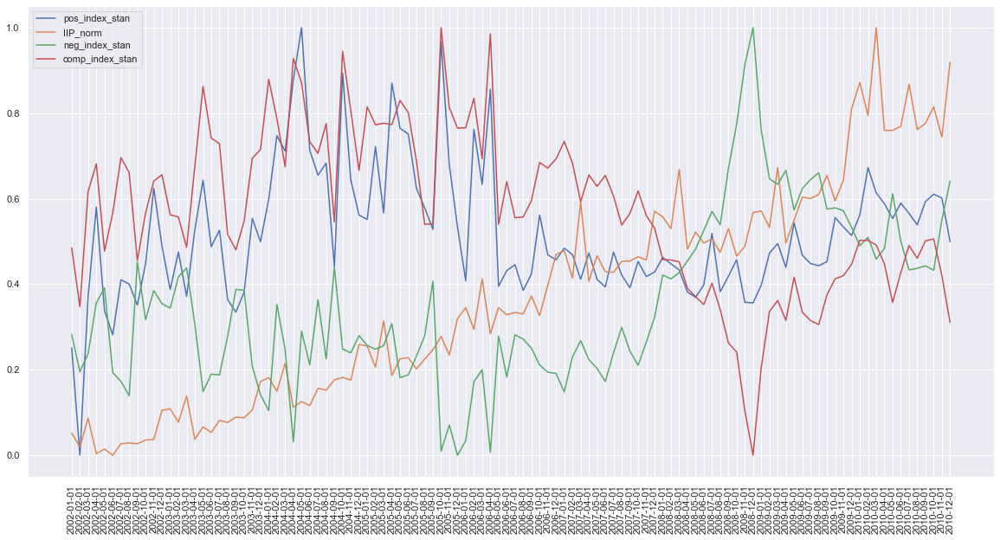

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20,10))
plt.plot(wpi_coal_df['Date'], df_index_sub2['pos_index_stan'])
plt.plot(wpi_coal_df['Date'], df_index_sub2['IIP_norm'])
plt.plot(wpi_coal_df['Date'], df_index_sub2['neg_index_stan'])
# plt.plot(wpi_coal_df['Date'], df_index_sub2['neutral_index_stan'])
plt.plot(wpi_coal_df['Date'], df_index_sub2['comp_index_stan'])
plt.xticks(rotation = 90)
plt.legend(["pos_index_stan", "IIP_norm", "neg_index_stan", "comp_index_stan"])


Here we can see that <b>compound index</b> and <b>positive index</b> is in correlation with <b>IIP</b> data, in 2008 there war decrement in economy due to depressiona and our results are indicating that as well.

In [44]:
df_index_sub2['pos_index_stan'].tolist()[70:]

[0.41780260342420483,
 0.42838203836332056,
 0.4623428774296783,
 0.44764988624858226,
 0.433463582513963,
 0.3819553641947646,
 0.3692602183348641,
 0.3985461790729601,
 0.5189945044354607,
 0.3823752728550951,
 0.4188506500206688,
 0.45727178071378116,
 0.3576788795026613,
 0.3563402994622158,
 0.39794487377283216,
 0.47265768189103596,
 0.49522137663482413,
 0.4394477389222735,
 0.5434649130283509,
 0.46790505921745185,
 0.44831549558890416,
 0.4431959013557716,
 0.45283686235428844,
 0.5559512365295425,
 0.5339937689948044,
 0.5138161039846216,
 0.5618379109379514,
 0.6726108652710967,
 0.6136408788444934,
 0.5882159523710082,
 0.5536387740663122,
 0.5896429909432128,
 0.5653576920480732,
 0.5390853880007405,
 0.5932697242200824,
 0.6105540792814326,
 0.6014529913566609,
 0.49965283756551004]

In [ ]:
df_index_sub2['IIP_norm'].tolist()

In [ ]:
df_index_sub2['neg_index_stan'].tolist()

In [ ]:
df_index_sub2['comp_index_stan'].tolist()

In [26]:
all_indicators_df = pd.read_csv("./indicators/Indicators - ALL_Indicators.csv")

all_indicators_df = all_indicators_df.iloc[35:143,:]
all_indicators_df.head()

,Date,SP500,Oil Import,Non-oil Import,Foreign Exchange Reserve,Foreign exchange rate,Total mining production,Total electricity production,Total Manufacturing production,M1,...,Ratio_export_import,Total_reserve_except_gold,WPI_industry_agg,National_curr_to_us_avg_rate,wholesale_food_price,us_import_goods_custom,Net_trade_value,Coal_production_Index,IIP-Electricity,WPI_MP
35,1/1/2002,1033.45,4921.0,15584.3,49479,48.3533,69.10933,45.16009,39.900014,17.476961,...,98.600194,4.720000e+10,57.11510,48.33571,35.50968,960.3,-59000000.0,49.987138,74.568762,63.448
36,2/1/2002,1132.98,4648.0,13652.1,50776,48.7168,67.22920,45.26441,40.379593,17.555309,...,87.460633,4.830000e+10,56.99628,48.69150,35.61143,792.1,-510000000.0,49.987138,68.422489,63.316
37,3/1/2002,1164.68,6341.0,15263.5,54106,48.7667,67.86163,46.10750,40.241476,17.687387,...,83.294734,5.170000e+10,57.08342,48.73944,35.77422,952.2,-730000000.0,49.987138,78.184217,63.404
38,4/1/2002,1182.01,6090.0,14491.0,55870,48.9386,68.51193,45.70339,40.832879,17.871623,...,96.950847,5.270000e+10,57.38246,48.91950,36.09981,967.5,-130000000.0,49.987138,72.851421,63.756
39,5/1/2002,1132.92,7583.0,17802.1,56779,49.0168,70.06784,45.13106,40.571133,18.200266,...,83.980065,5.350000e+10,57.63991,49.00000,36.03876,993.7,-780000000.0,49.987138,74.071637,64.020


In [27]:
all_indicators_df[['SP500', 'Oil Import', 'Non-oil Import',
       'Foreign Exchange Reserve', 'Foreign exchange rate',
       'Total mining production', 'Total electricity production',
       'Total Manufacturing production', 'M1', 'Real_effective_exchange_rate',
       'Consumer_durable_goods', 'Consumer_nondurable_goods', 'M3',
       'Real_broad_eer', 'CPI', 'Interest_Discount_rate',
       'Ratio_export_import', 'Total_reserve_except_gold', 'WPI_industry_agg',
       'National_curr_to_us_avg_rate', 'wholesale_food_price',
       'us_import_goods_custom', 'Net_trade_value', 'Coal_production_Index',
       'IIP-Electricity', 'WPI_MP']] = MinMaxScaler().fit_transform(all_indicators_df[['SP500', 'Oil Import', 'Non-oil Import',
       'Foreign Exchange Reserve', 'Foreign exchange rate',
       'Total mining production', 'Total electricity production',
       'Total Manufacturing production', 'M1', 'Real_effective_exchange_rate',
       'Consumer_durable_goods', 'Consumer_nondurable_goods', 'M3',
       'Real_broad_eer', 'CPI', 'Interest_Discount_rate',
       'Ratio_export_import', 'Total_reserve_except_gold', 'WPI_industry_agg',
       'National_curr_to_us_avg_rate', 'wholesale_food_price',
       'us_import_goods_custom', 'Net_trade_value', 'Coal_production_Index',
       'IIP-Electricity', 'WPI_MP']])

all_indicators_df.head()

,Date,SP500,Oil Import,Non-oil Import,Foreign Exchange Reserve,Foreign exchange rate,Total mining production,Total electricity production,Total Manufacturing production,M1,...,Ratio_export_import,Total_reserve_except_gold,WPI_industry_agg,National_curr_to_us_avg_rate,wholesale_food_price,us_import_goods_custom,Net_trade_value,Coal_production_Index,IIP-Electricity,WPI_MP
35,1/1/2002,0.000000,0.005498,0.020677,0.000000,0.765982,0.049373,0.003267,0.000000,0.000000,...,1.000000,0.000000,0.004114,0.755969,0.000000,0.079958,1.000000,0.0,0.264499,0.004060
36,2/1/2002,0.013167,0.000000,0.000000,0.004892,0.796628,0.000000,0.007153,0.009162,0.001525,...,0.768945,0.004267,0.000000,0.785981,0.002741,0.000000,0.971708,0.0,0.058814,0.000000
37,3/1/2002,0.017361,0.034098,0.017244,0.017451,0.800835,0.016608,0.038556,0.006523,0.004095,...,0.682537,0.017455,0.003017,0.790024,0.007126,0.076107,0.957907,0.0,0.385490,0.002707
38,4/1/2002,0.019653,0.029043,0.008977,0.024105,0.815327,0.033685,0.023504,0.017821,0.007680,...,0.965790,0.021334,0.013371,0.805213,0.015898,0.083380,0.995546,0.0,0.207028,0.013534
39,5/1/2002,0.013159,0.059113,0.044411,0.027533,0.821920,0.074543,0.002186,0.012821,0.014075,...,0.696752,0.024438,0.022285,0.812003,0.014253,0.095835,0.954771,0.0,0.247863,0.021654


In [29]:
all_indicators_df.describe()

,SP500,Oil Import,Non-oil Import,Foreign Exchange Reserve,Foreign exchange rate,Total mining production,Total electricity production,Total Manufacturing production,M1,Real_effective_exchange_rate,...,Ratio_export_import,Total_reserve_except_gold,WPI_industry_agg,National_curr_to_us_avg_rate,wholesale_food_price,us_import_goods_custom,Net_trade_value,Coal_production_Index,IIP-Electricity,WPI_MP
count,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,...,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000
mean,0.403670,0.331152,0.389291,0.498483,0.513791,0.451891,0.440331,0.458604,0.382323,0.327664,...,0.438221,0.491653,0.473646,0.511163,0.284974,0.422600,0.677203,0.446439,0.441872,0.475906
std,0.292733,0.249716,0.289775,0.320270,0.226208,0.264719,0.290488,0.320333,0.289604,0.270721,...,0.210573,0.313895,0.292258,0.223740,0.272785,0.236454,0.243626,0.339685,0.220072,0.293261
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.154686,0.096474,0.128365,0.254121,0.386056,0.254247,0.187496,0.151623,0.129277,0.132467,...,0.278458,0.254267,0.240766,0.387497,0.052901,0.213114,0.503419,0.120316,0.263743,0.237518
50%,0.379285,0.291119,0.338169,0.432774,0.530392,0.423662,0.431873,0.419282,0.339910,0.231823,...,0.401351,0.427851,0.454831,0.523159,0.200418,0.436903,0.733956,0.359480,0.437220,0.465215
75%,0.653565,0.542461,0.628711,0.845030,0.690804,0.626235,0.678718,0.766024,0.610191,0.488109,...,0.574132,0.816718,0.750131,0.680864,0.434921,0.575733,0.901763,0.830326,0.591571,0.752310
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [28]:
pos_index_stan_list = df_index['pos_index_stan'].tolist()
neg_index_stan_list = df_index['neg_index_stan'].tolist()
neutral_index_stan_list = df_index['neutral_index_stan'].tolist()
comp_index_stan_list = df_index['comp_index_stan'].tolist()

In [35]:
all_indicators_df.columns[0]

'Date'

#### Comparing the results with 27 indicators taken from government websites

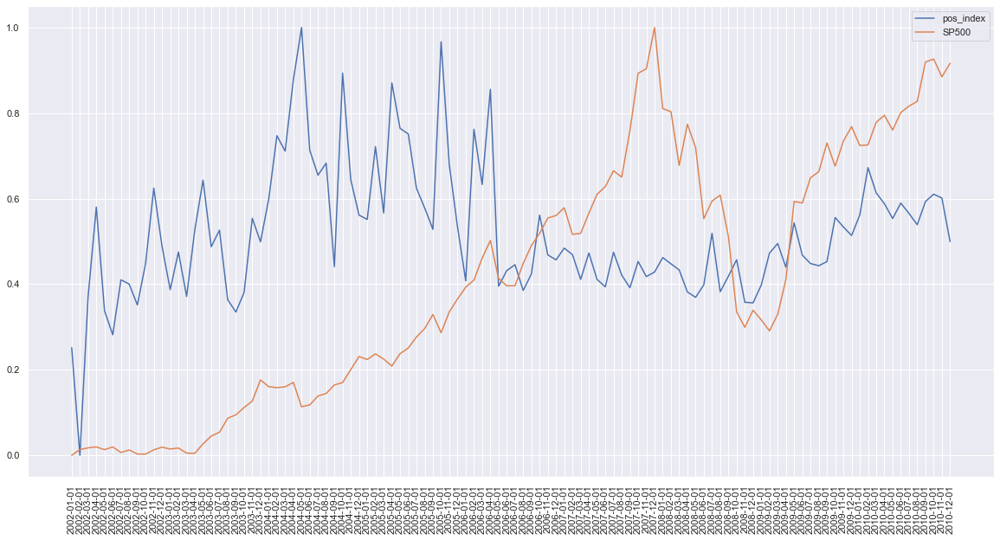

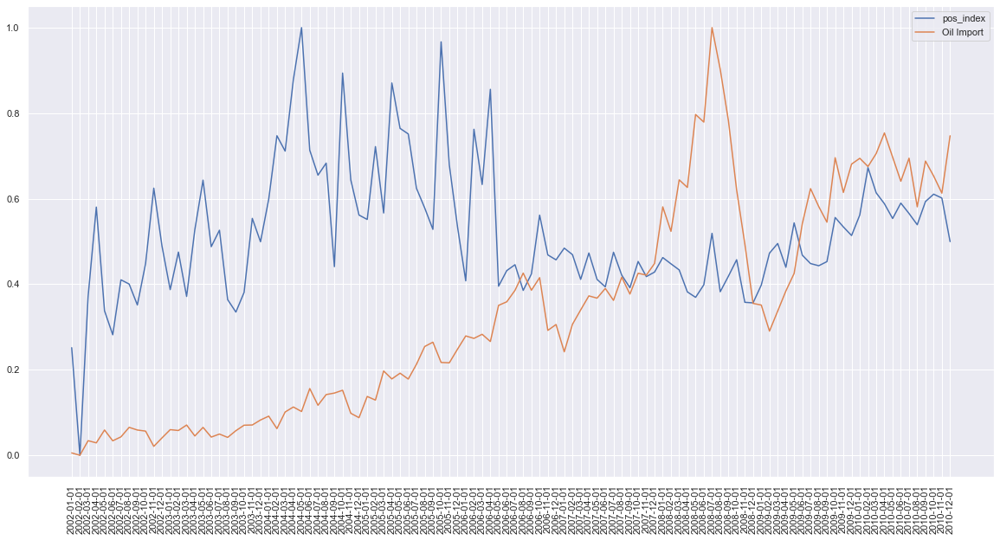

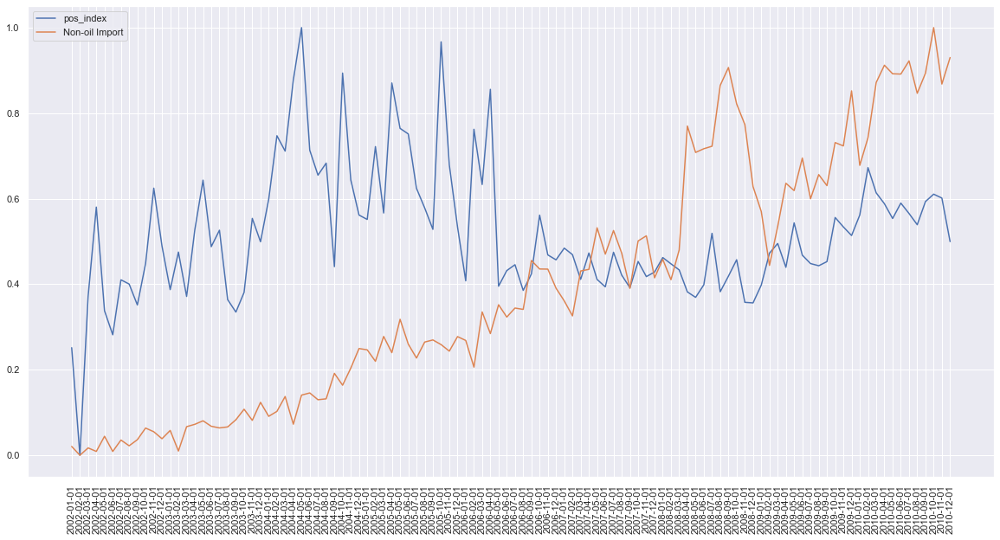

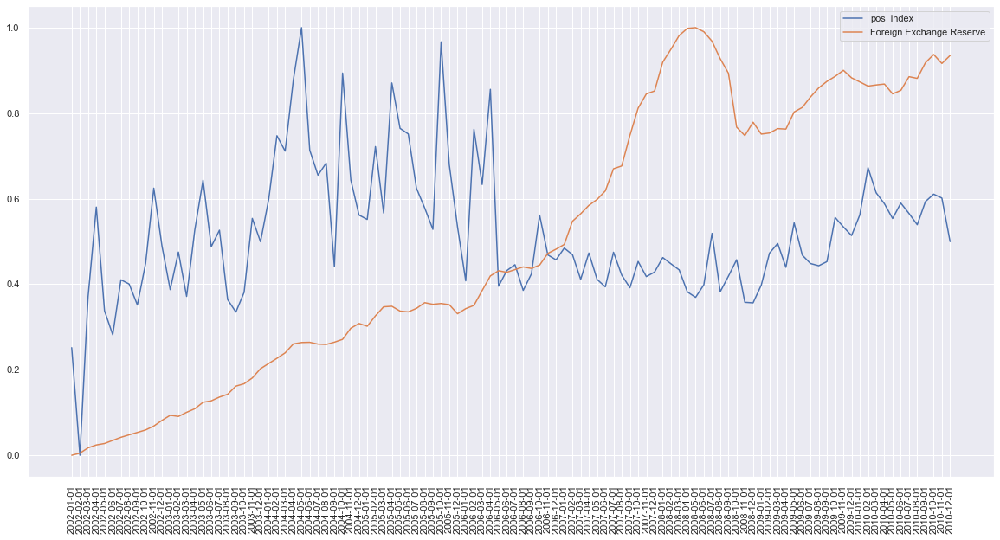

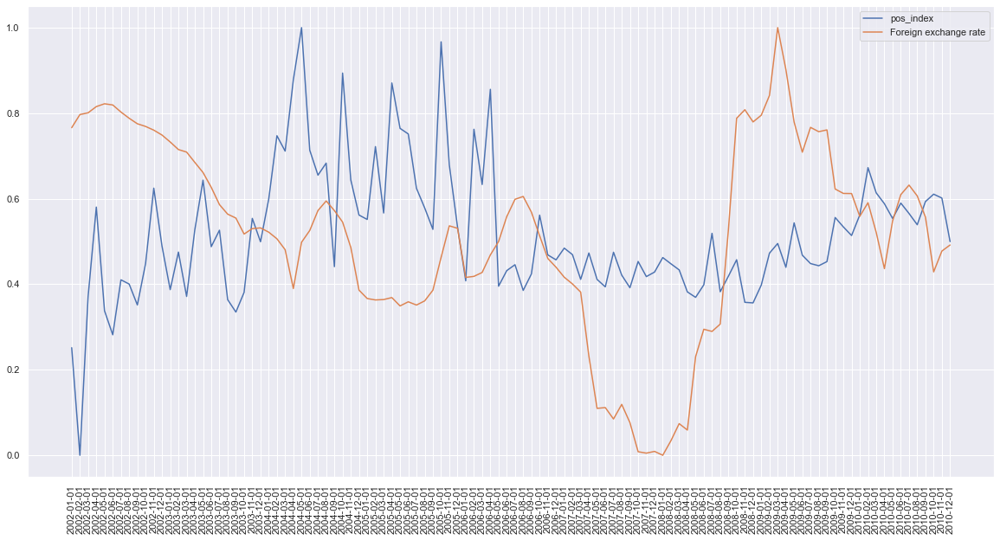

...

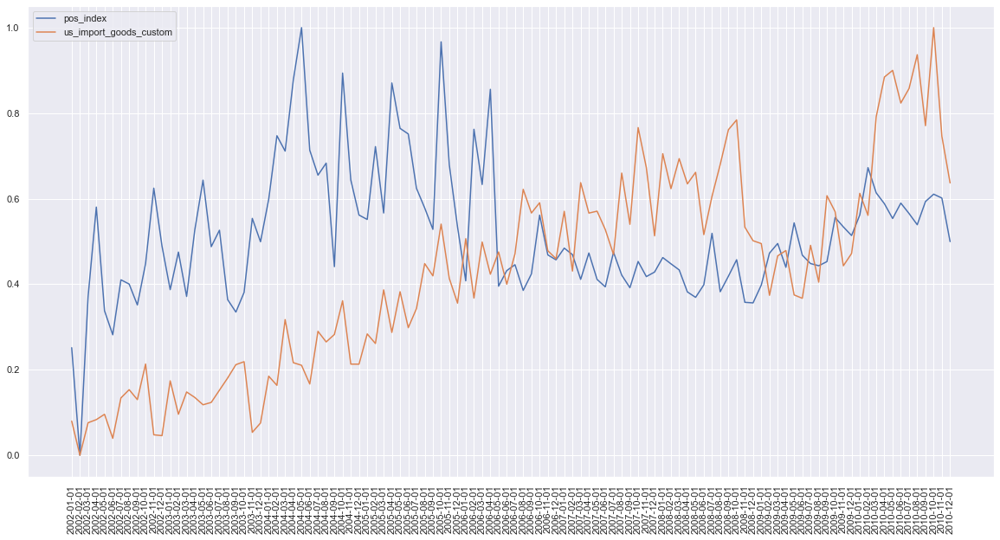

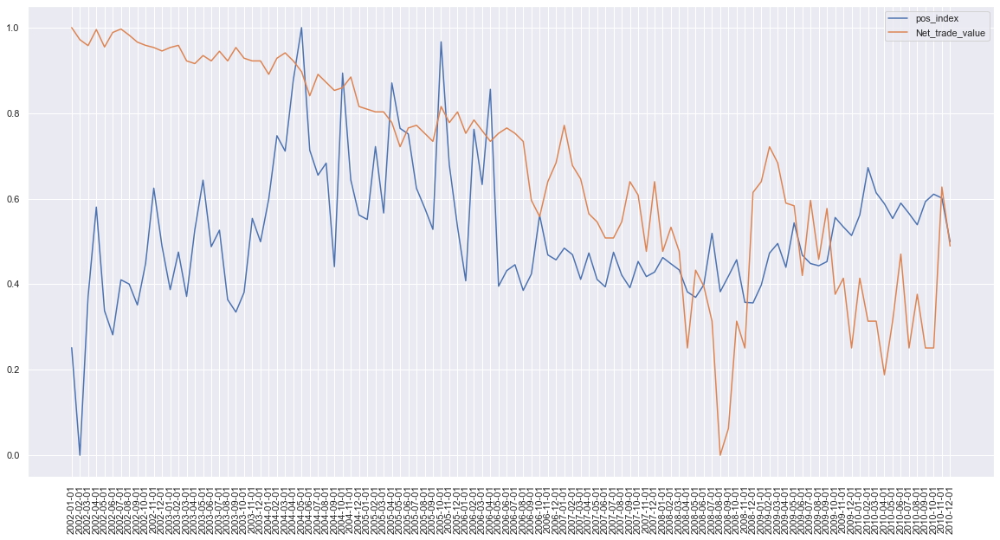

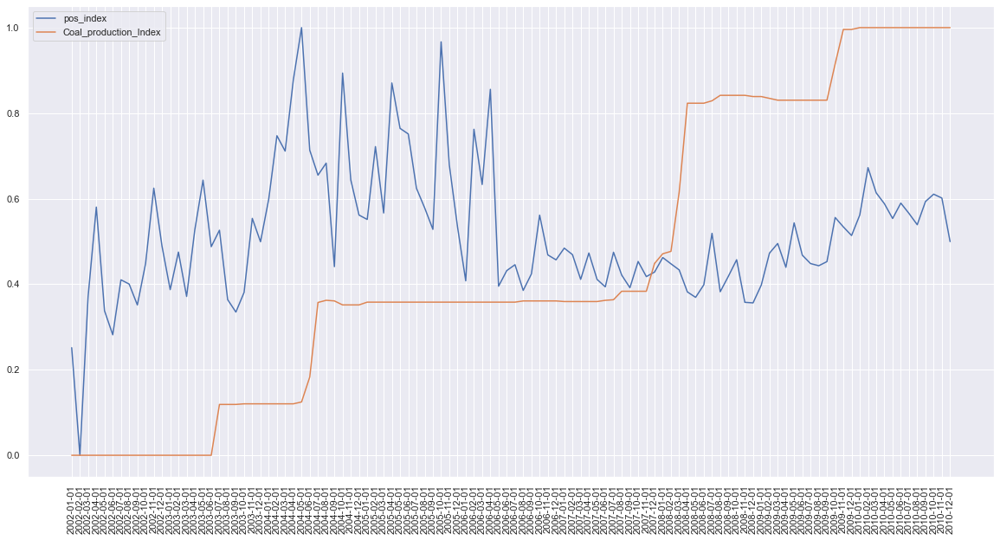

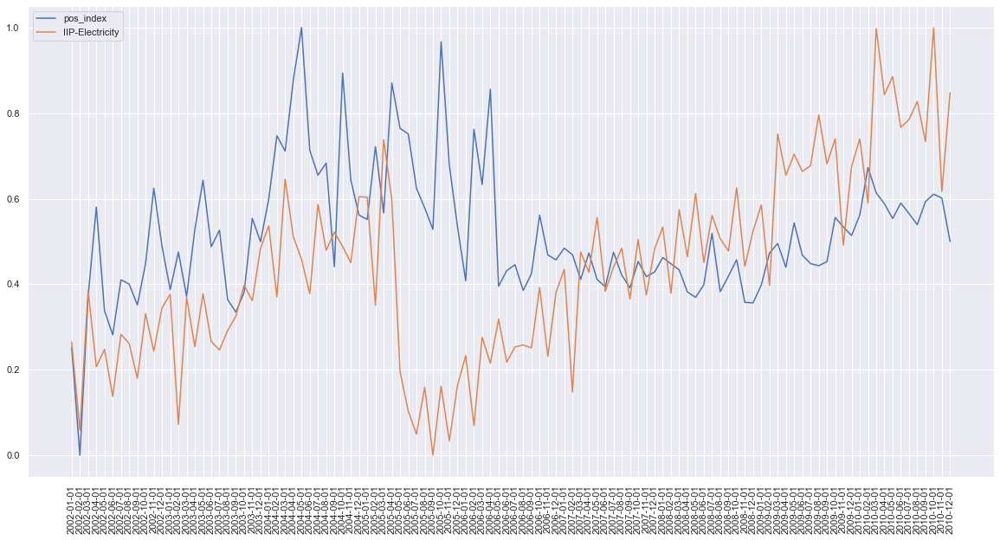

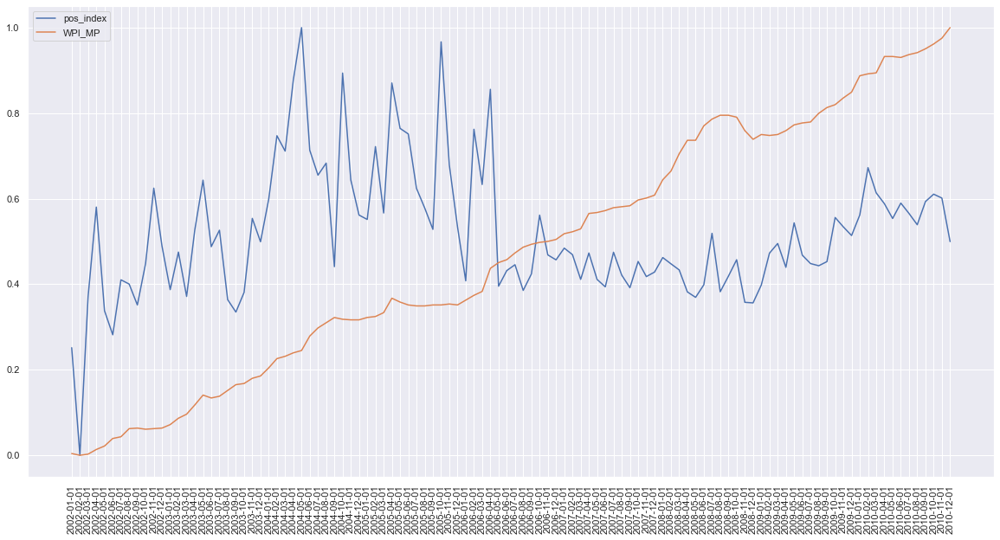

In [36]:
import seaborn as sns
from matplotlib import pyplot as plt

sns.set(style='darkgrid')


for i in range(1,27):
    y = all_indicators_df.iloc[:, i]
    
    plt.figure(figsize=(20,10))
    plt.plot(wpi_coal_df['Date'], pos_index_stan_list)
    plt.plot(wpi_coal_df['Date'], y)
    plt.xticks(rotation = 90)
    plt.legend(["pos_index",all_indicators_df.columns[i]])

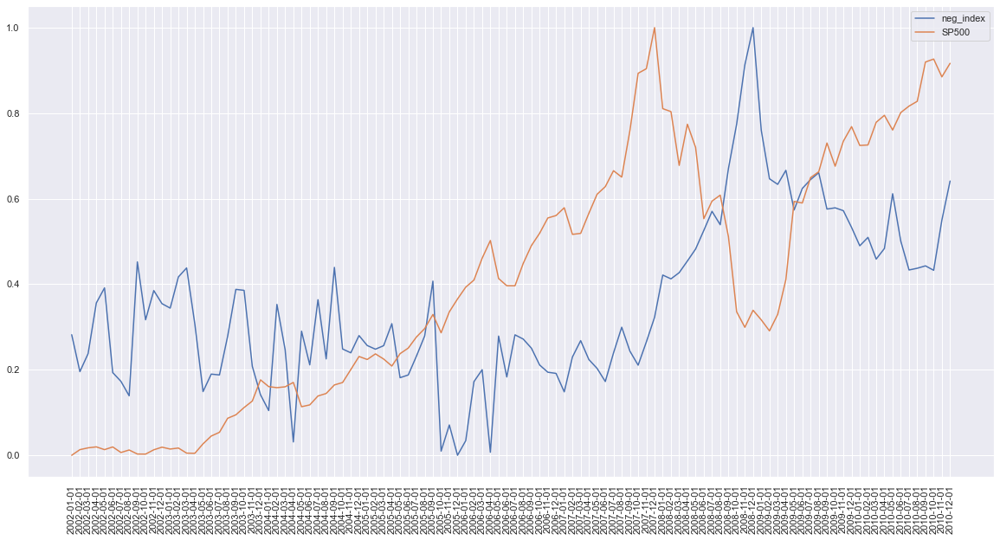

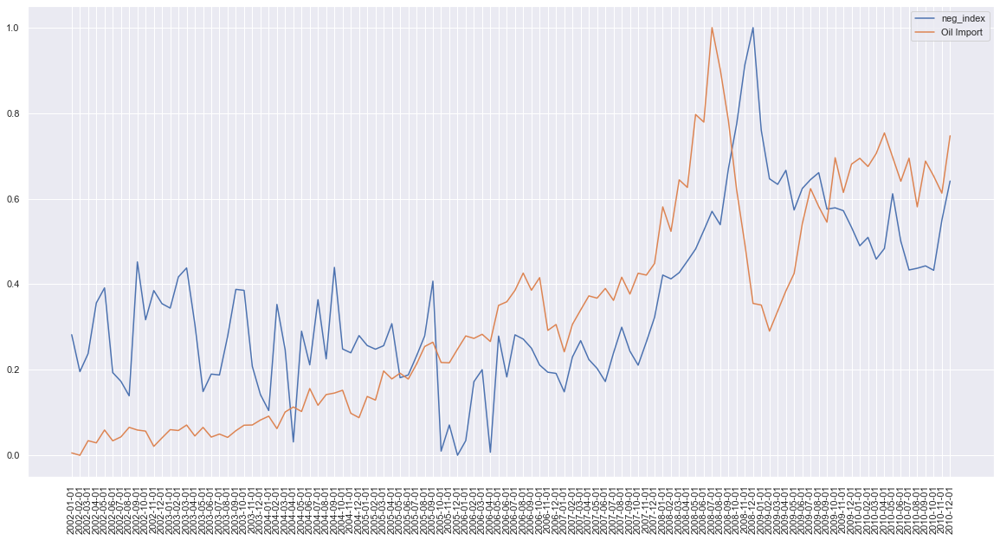

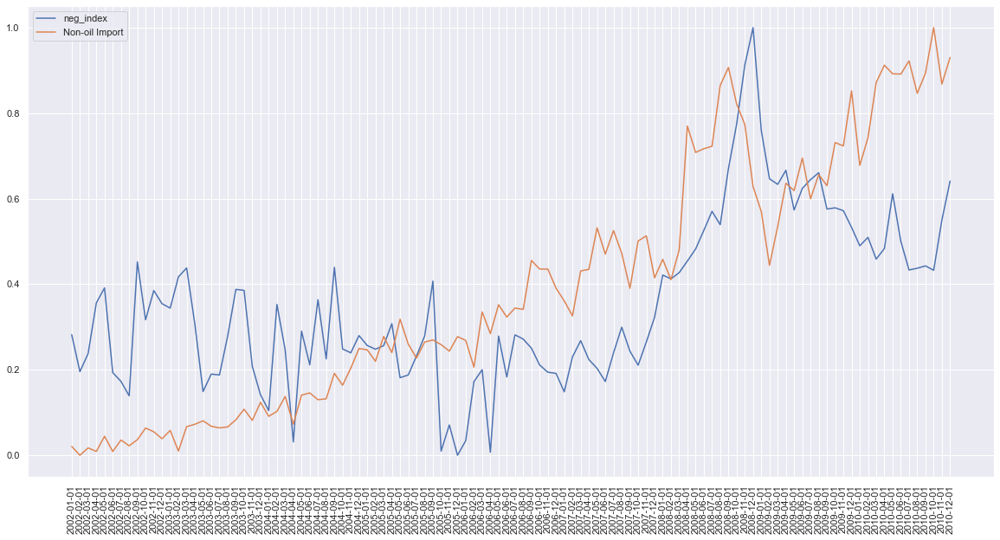

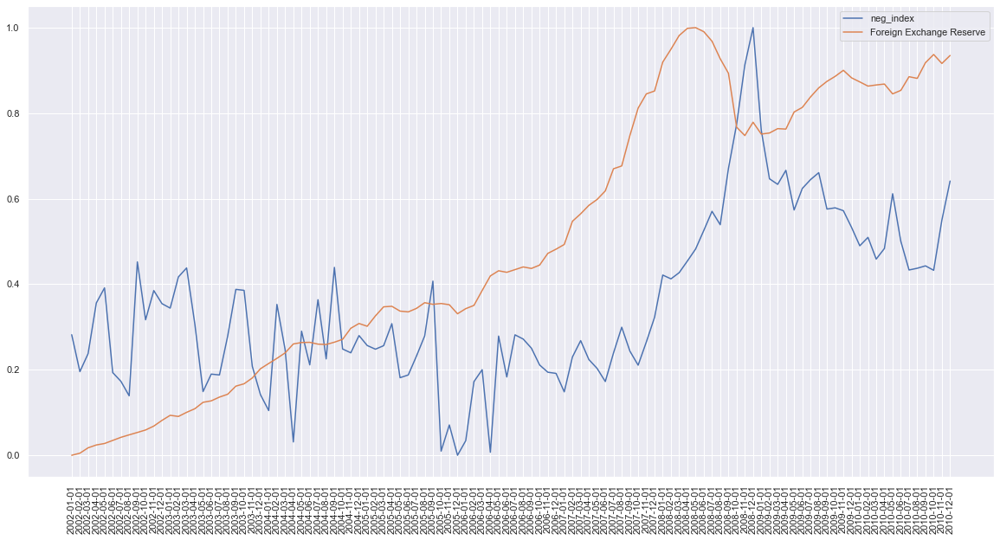

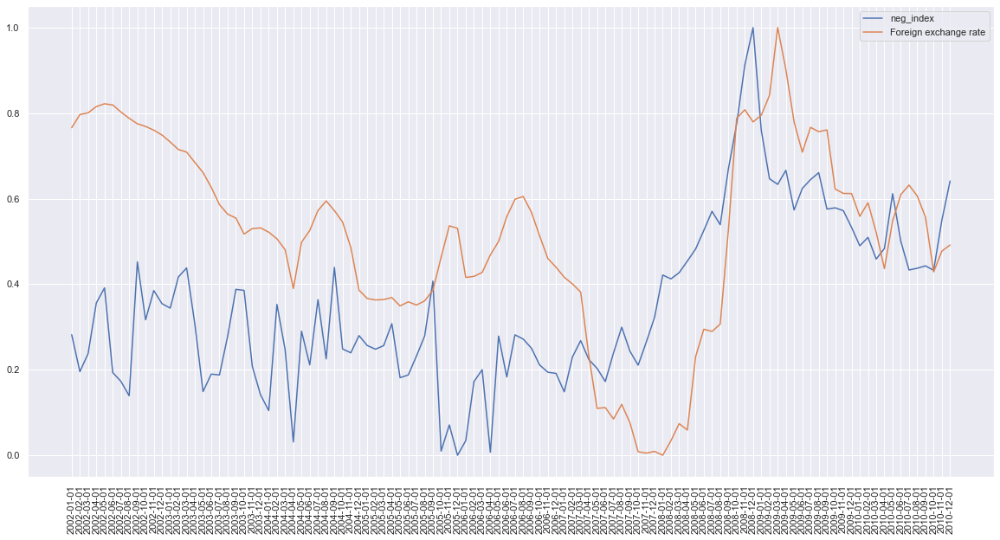

...

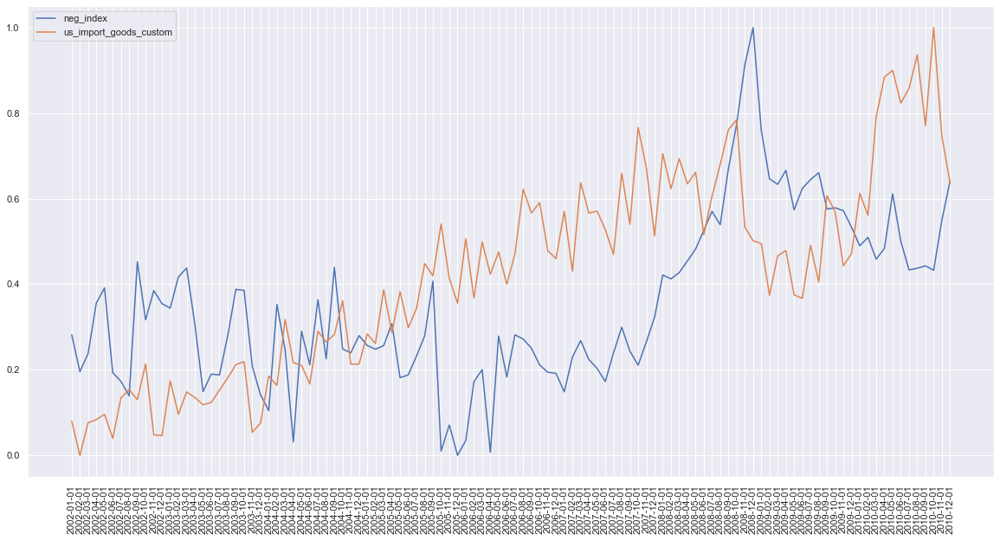

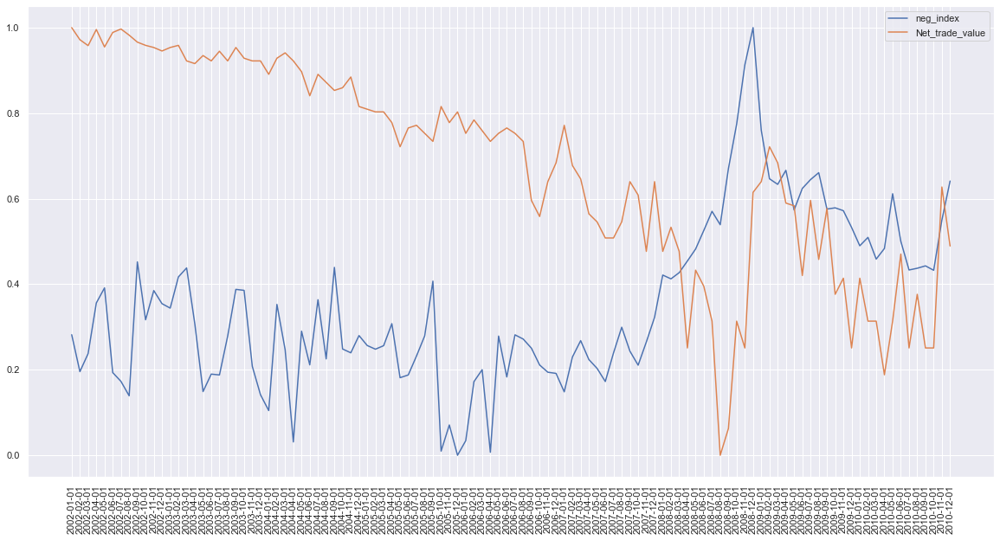

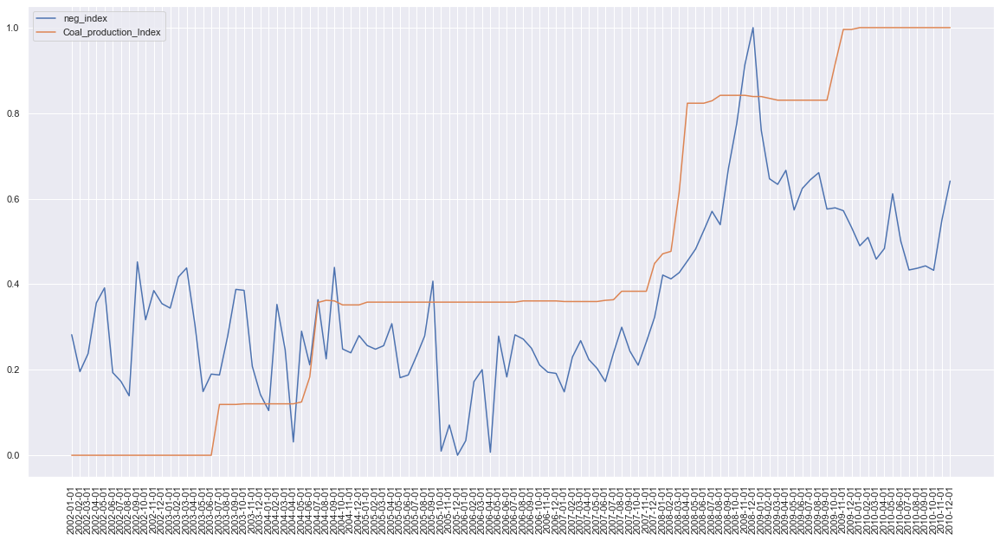

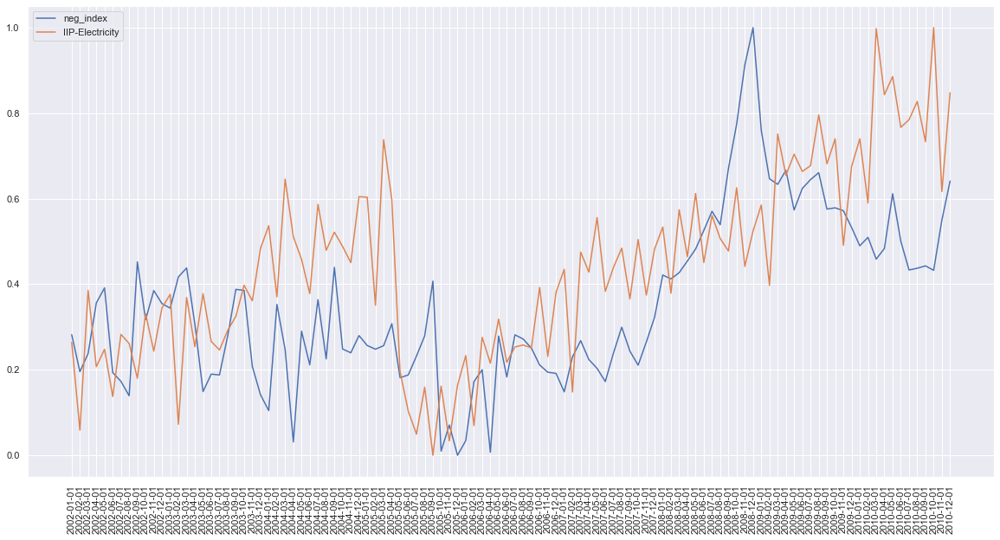

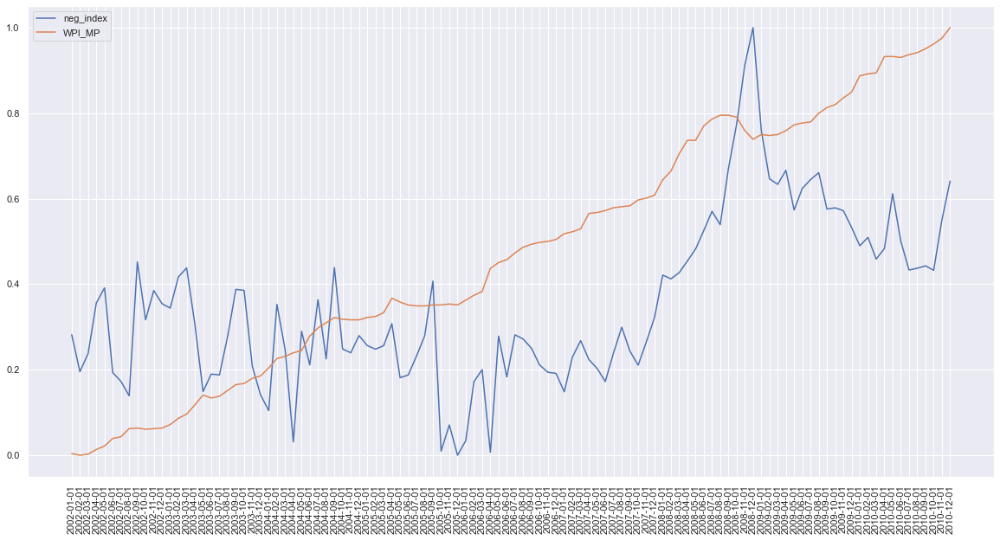

In [37]:
sns.set(style='darkgrid')



for i in range(1,27):
    y = all_indicators_df.iloc[:, i]
    
    plt.figure(figsize=(20,10))
    plt.plot(wpi_coal_df['Date'], neg_index_stan_list)
    plt.plot(wpi_coal_df['Date'], y)
    plt.xticks(rotation = 90)
    plt.legend(["neg_index",all_indicators_df.columns[i]])

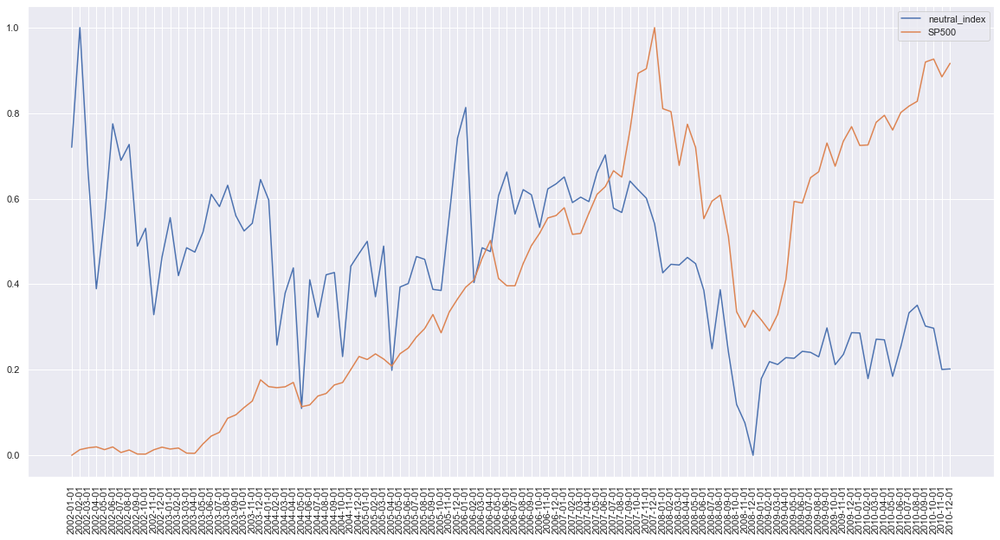

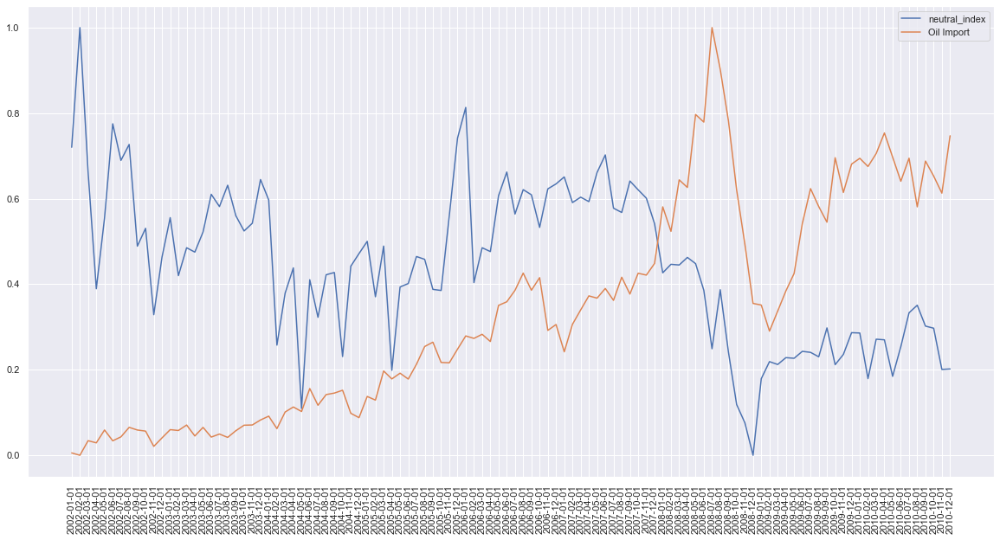

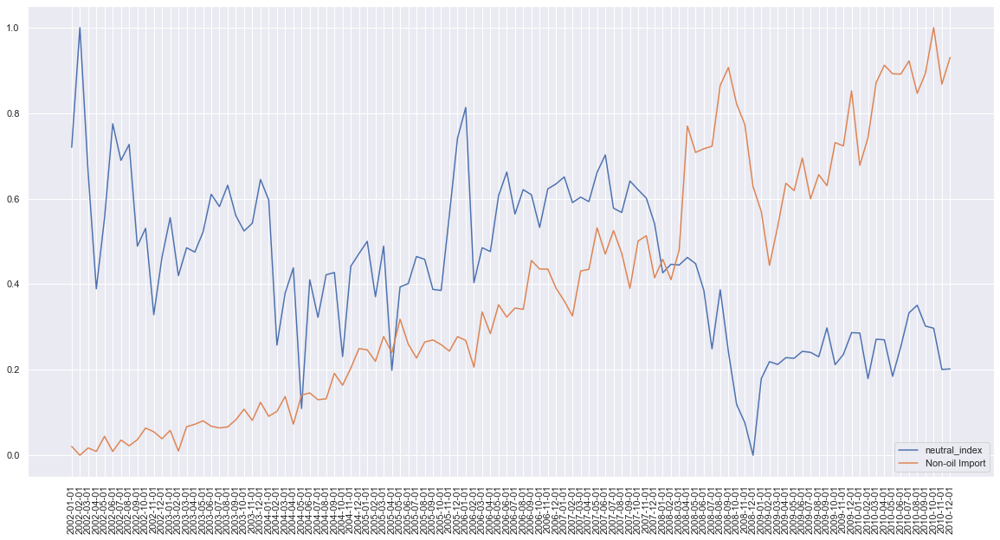

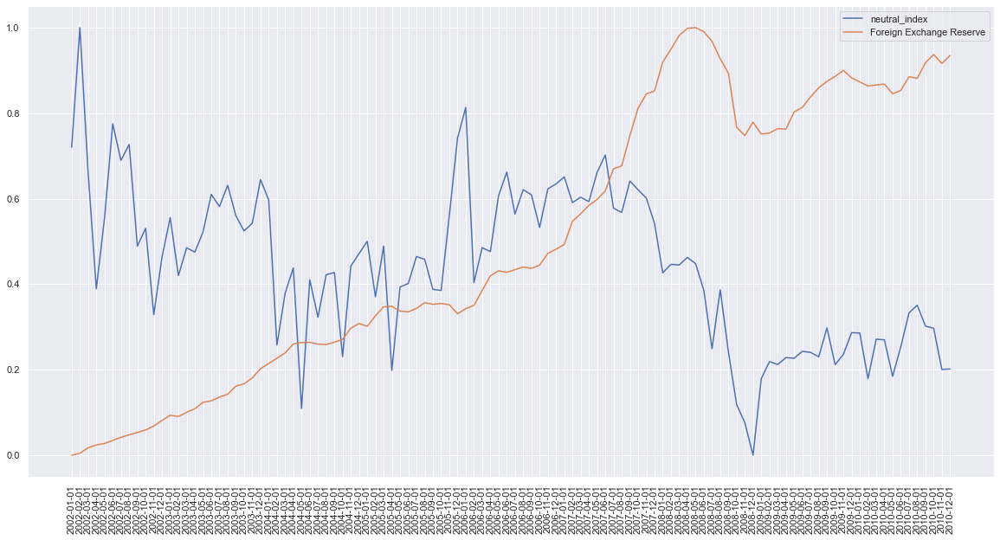

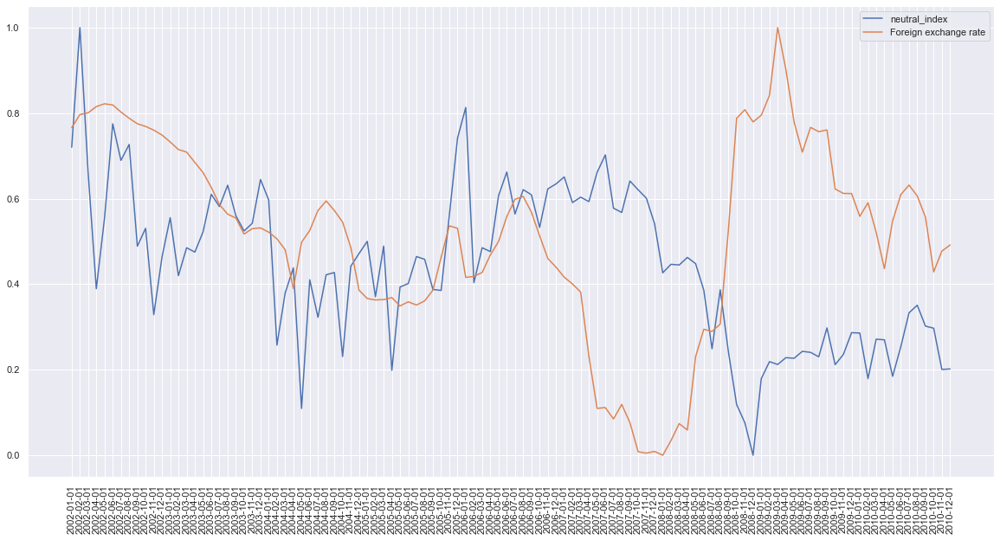

...

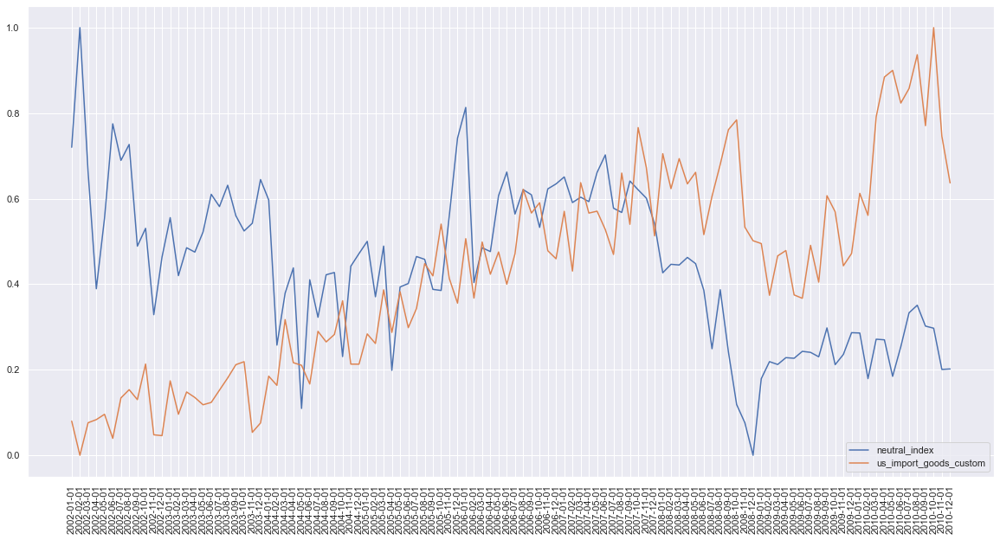

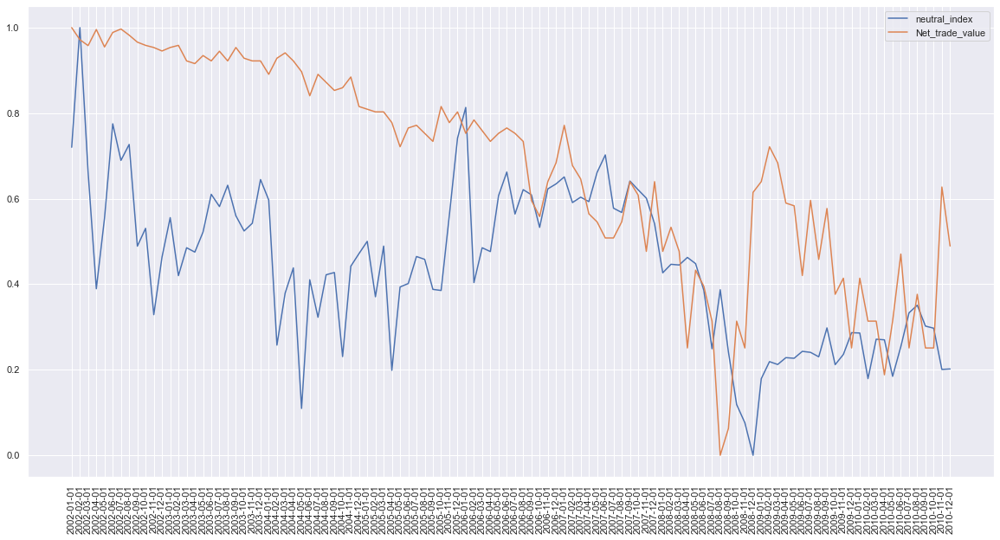

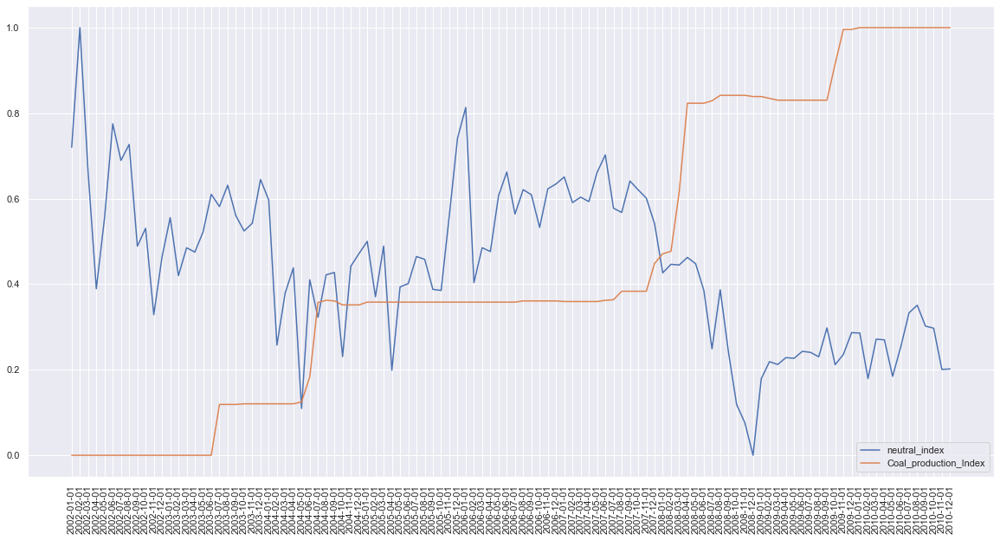

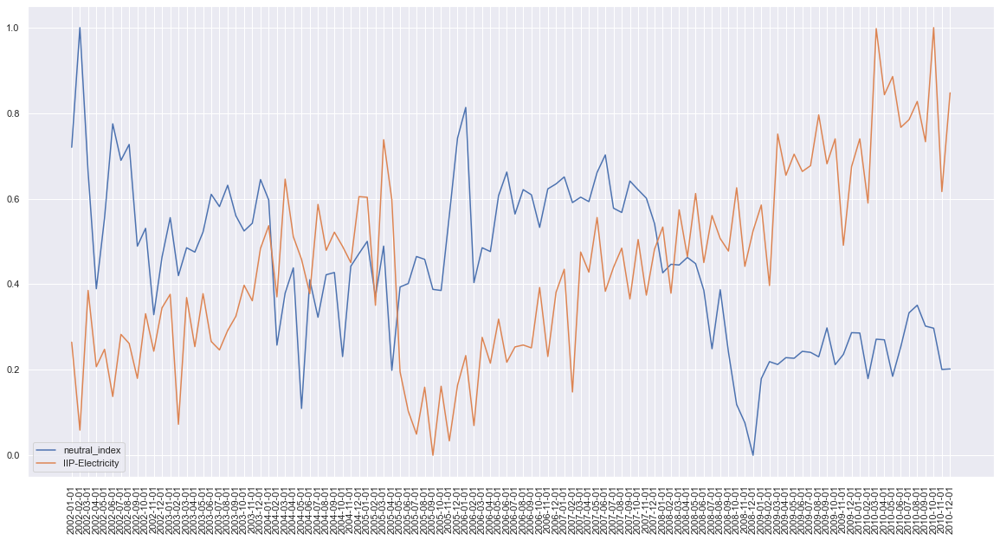

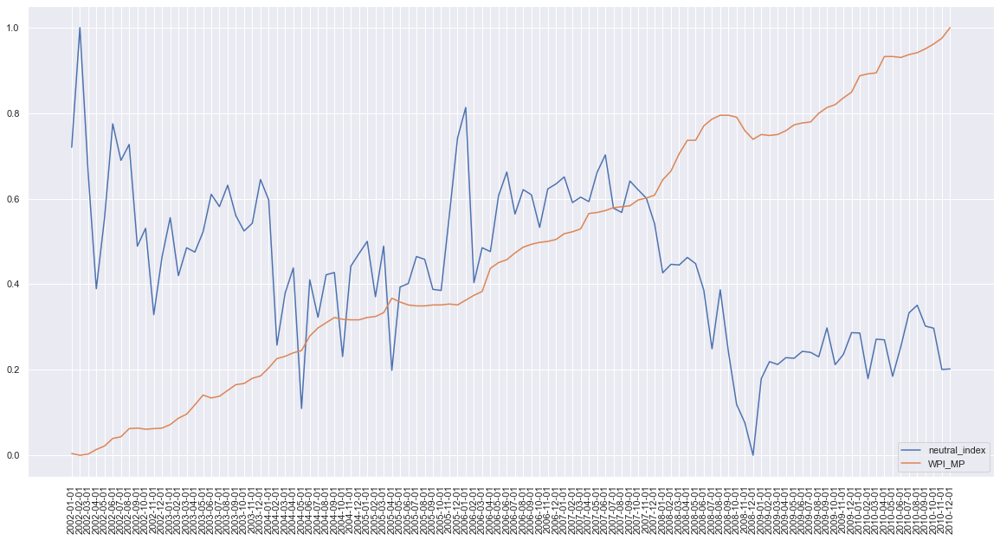

In [38]:
sns.set(style='darkgrid')


for i in range(1,27):
    y = all_indicators_df.iloc[:, i]
    
    plt.figure(figsize=(20,10))
    plt.plot(wpi_coal_df['Date'], neutral_index_stan_list)
    plt.plot(wpi_coal_df['Date'], y)
    plt.xticks(rotation = 90)
    plt.legend(["neutral_index",all_indicators_df.columns[i]])

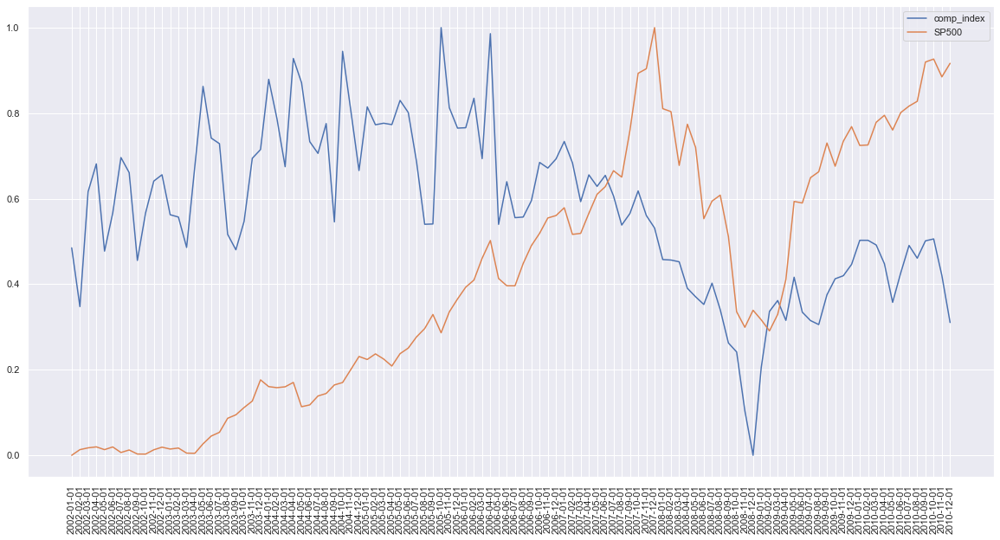

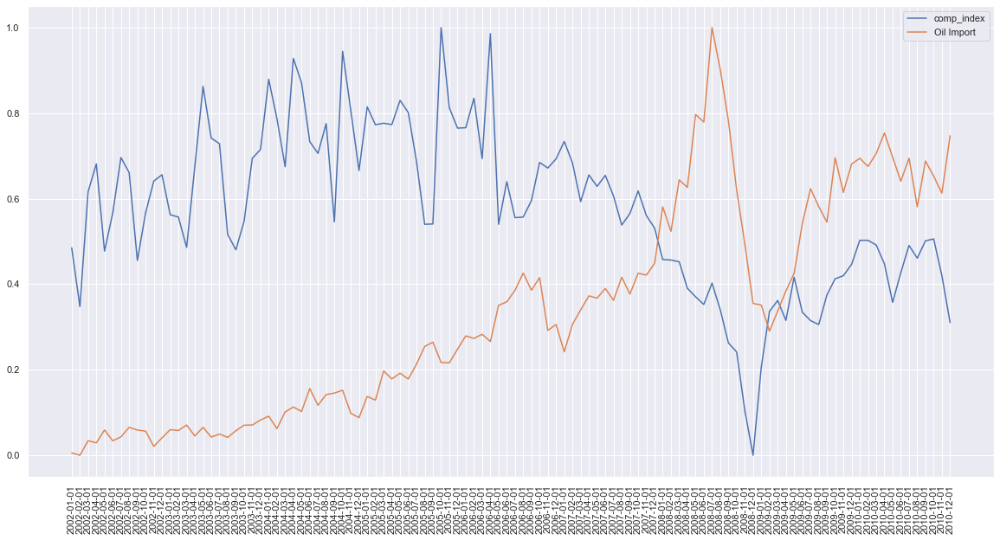

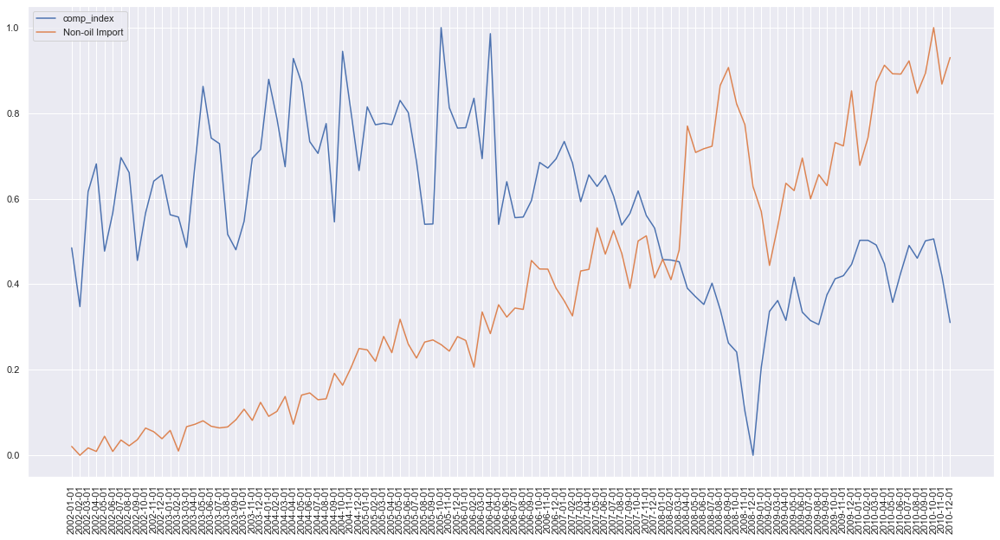

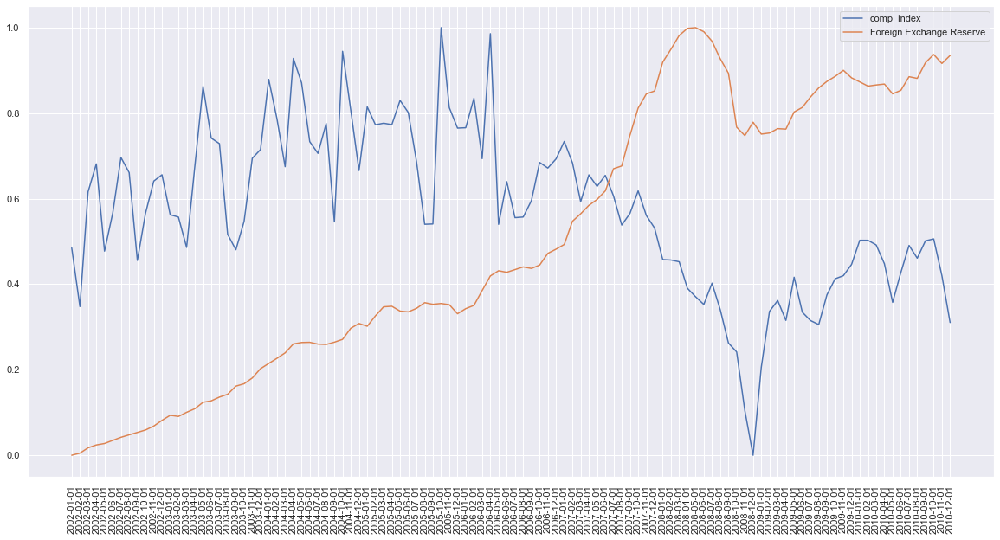

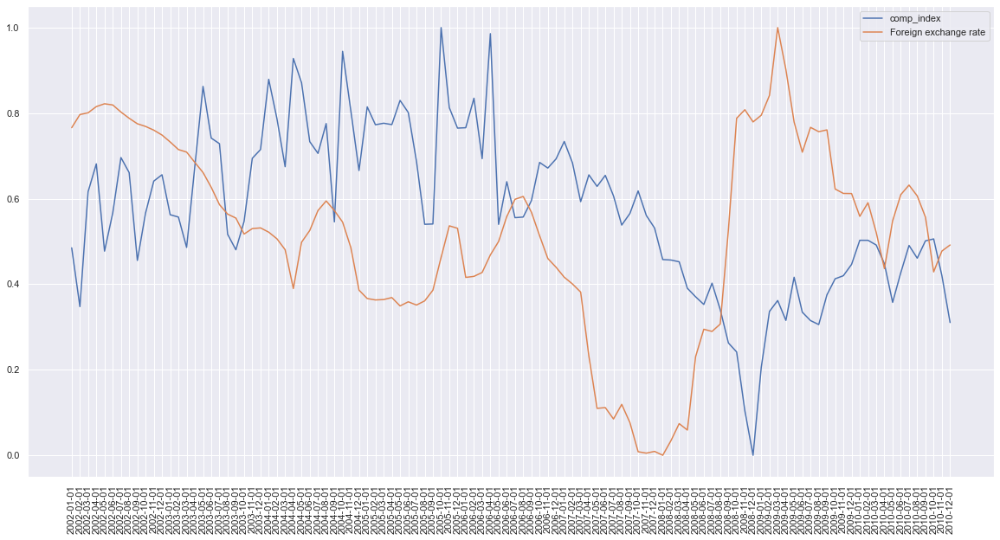

...

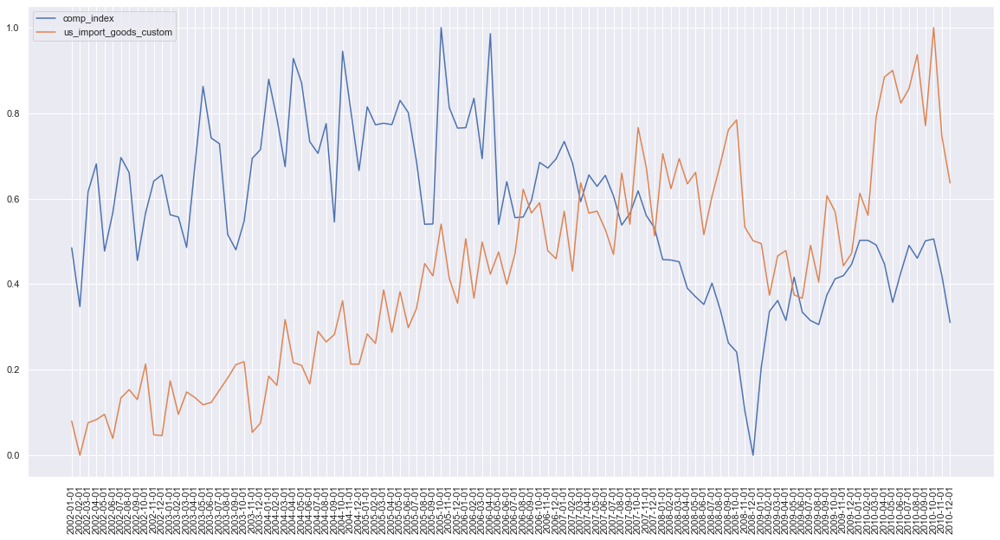

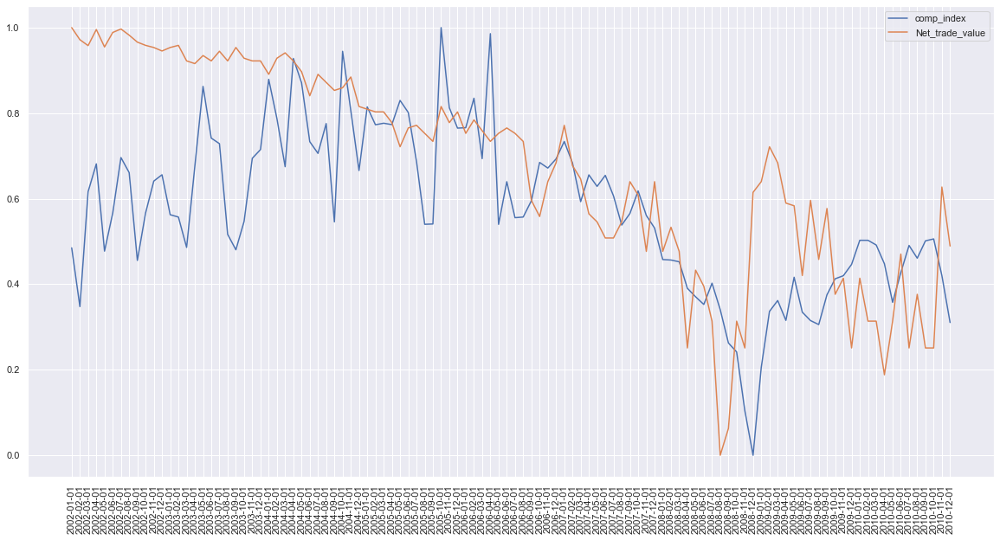

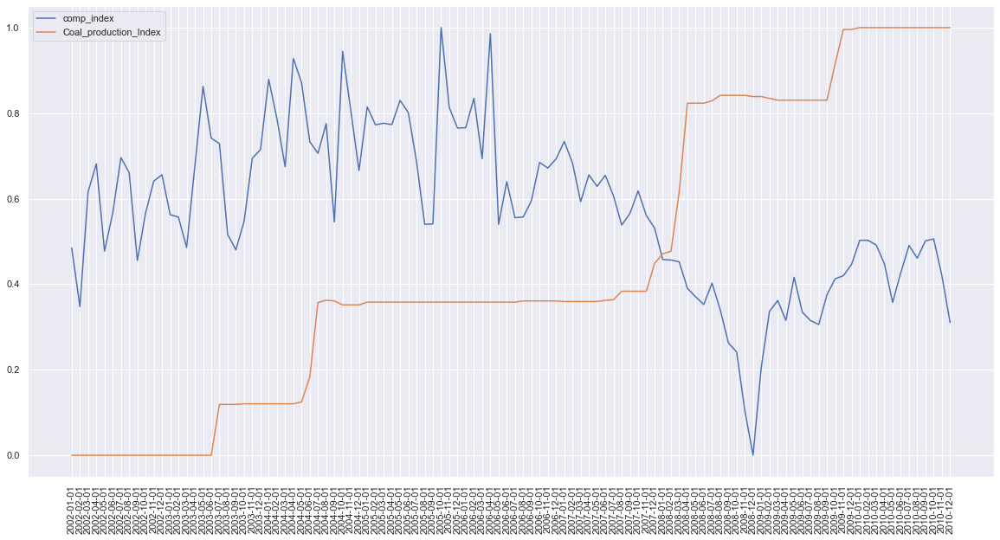

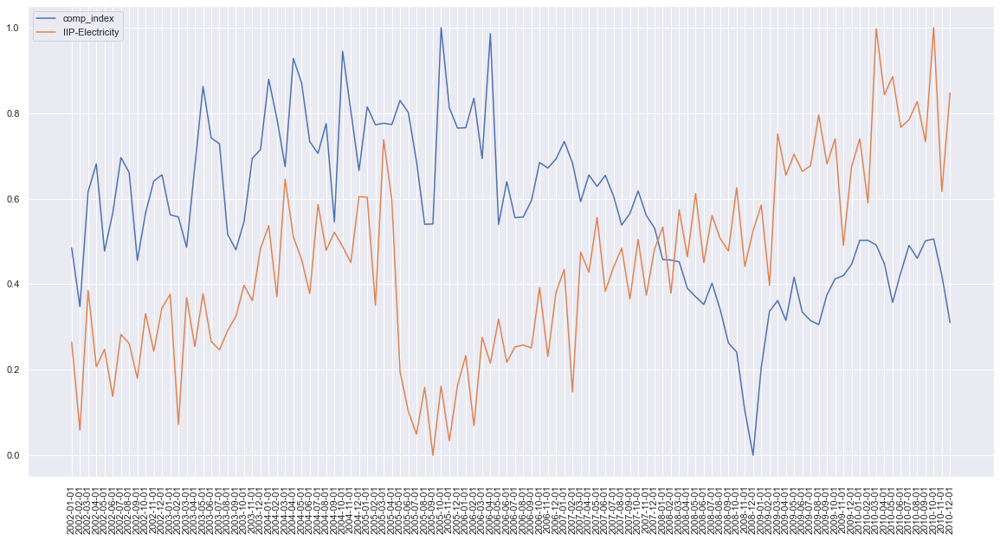

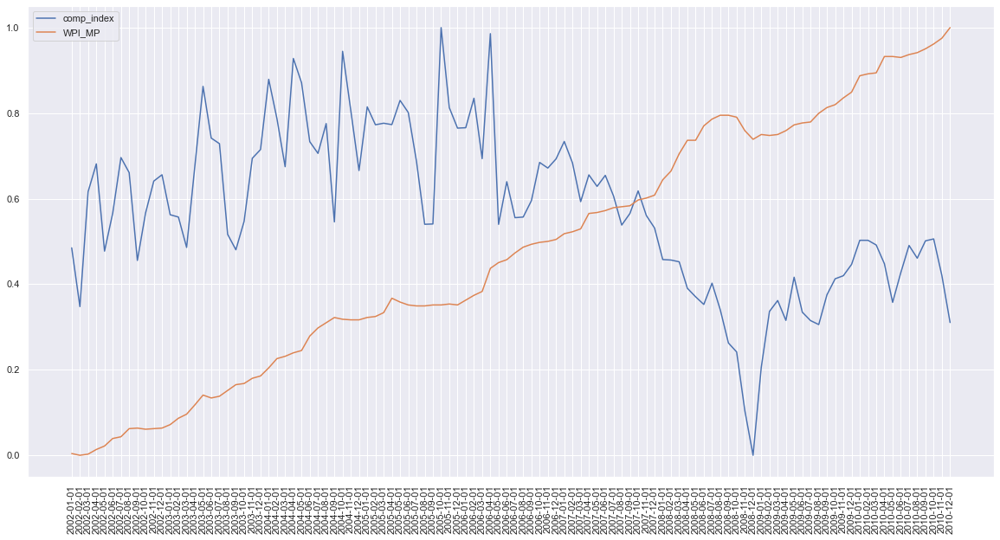

In [39]:
sns.set(style='darkgrid')


for i in range(1,27):
    y = all_indicators_df.iloc[:, i]
    
    plt.figure(figsize=(20,10))
    plt.plot(wpi_coal_df['Date'], comp_index_stan_list)
    plt.plot(wpi_coal_df['Date'], y)
    plt.xticks(rotation = 90)
    plt.legend(["comp_index",all_indicators_df.columns[i]])